## Table of Contents

1. [Executive Summary](#executive-summary)
2. [Part 0: Dataset Selection](#part-0)
3. [Part 1: Setting Up the Problem](#part-1)
    - [1.1 Bibliography and State of the Art](#part-1-1)
    - [1.2 Dataset Description](#part-1-2)
    - [1.3 Random Classifier Performance](#part-1-3)
    - [1.4 Baseline Implementation](#part-1-4)
4. [Part 2: Data Scientist Challenge](#part-2)
    - [2.1 BERT Model with Limited Data](#part-2-1)
    - [2.2 Dataset Augmentation](#part-2-2)
    - [2.3 Zero-Shot Learning with LLM](#part-2-3)
    - [2.4 Data Generation with LLM](#part-2-4)
    - [2.5 Optimal Technique Application](#part-2-5)
5. [Part 3: State of the Art Comparison](#part-3)
    - [3.1 Full Dataset Training](#part-3-1)
    - [3.2 Learning Curve](#part-3-2)
    - [3.3 Technique Comparison](#part-3-3)
    - [3.4 Methodology Analysis](#part-3-4)
6. [Part 4: Model Distillation](#part-4)
    - [4.1 Model Distillation](#part-4-1)
    - [4.2 Performance and Speed Comparison](#part-4-2)
    - [4.3 Analysis and Improvements](#part-4-3)
7. [Conclusion](#conclusion)


Abstract:

Our project aimed to investigate classification models on a database of financial tweets and test these models using different quantities of data for training. Below is a summary of our main findings. 

We started off by creating a baseline model using logistic regression and a Spacy Matcher algorithm. These models performed reasonably well, with accuracy of 0.76 and 0.36 respectively. These models did not leverage the power of LLMs, but served as a reference point from which we could assess more sophisticated models. We then built an LLM using BERT with a classifier head that was trained using only 32 samples. The performance here was very poor, likely because of two features of our dataset: our dataset consistent exclusively of tweets about a specialised subject, so semantic meaning in this context was often not consistent with semantic meaning in a more general context. Our dataset consisted exclusively of tweets, which are limited to 260 characters. Although BERT embeddings perform truncation and padding to ensure the output vector is consistently the same size, the lack of words in the input likely contributed to some inability in extracting the high-level semantic meaning present in the tweets. These two properties were a common theme throughout the project. 

We then tried to improve performance in the 32-sample model by performing hyperparameter optimisation using the whole training set, and then clustering the 32 samples to create more training examples. This improved performance a little, but the highly overlapping nature of the classes (as evidenced by PCA analysis) demonstrated that clustering did not disambiguate the classes to the extent that we had hoped. 

Next, we used a GPT model to instantiate zero-shot learning, which was impressively strong, not too far off the performance of the BERT model trained on 1100 samples. When we combined the GPT model with the BERT-32 sample model, performance markedly improved. 

We then tested the full BERT model using different proportions of the original training set. The model exhibited a logarithmic learning curve that initially improved very rapidly as more samples were added and it was able to learn a more sophisticated representation of the feature space, but this rate of increase declined as more samples were added and the model fell into a local optimum. 

We compared performance of our models with SOTA model, which outperformed our models by about 8%. We note that the SOTA model was trained on a dataset that was 115% the size of ours, and far more general, and therefore better understood by the LLMs that had been trained on similar text. Afterwards, we reviewed some of the errors our models made, and concluded that errors made by the models with little access to training data tended to be due to contextual changes to the semantic meaning of words, but the fully trained BERT model’s mistakes were often due to ambiguity in the dataset, rather than error on the part of the model. 

Finally, we attempted to distil our model into a more concise design using the teacher-learning framework, but were ultimately unsuccessful in training it to a level comparable to the original model. 


### Disclaimer:

Not all of we code we wrote is contained in this notebook

We are importing Code from following local .py files aswell:


- misc.py | Fuctions for downloading Dataset and Creating Train, Test, Val Split

- preprocessing.py | preprocessing

- bert_train.py | Traing Class and Wrapper for Keras + Bert Huggingface Models

- zero_shot_lerning.py | OpenAI API wrapper Class, does Zero and Few Shot Classification

- synthetic_data.py | generates a synthetic dataset for our Distilation Process

- distilation.py | Custom Pytorch Transformer Encoder model, Destilation Fuction



### Imports And Function Definition

In [42]:
label2topic = {
    0: "Analyst Update",
    1: "Fed | Central Banks",
    2: "Company | Product News",
    3: "Treasuries | Corporate Debt",
    4: "Dividend",
    5: "Earnings",
    6: "Energy | Oil",
    7: "Financials",
    8: "Currencies",
    9: "General News | Opinion",
    10: "Gold | Metals | Materials",
    11: "IPO",
    12: "Legal | Regulation",
    13: "M&A | Investments",
    14: "Macro",
    15: "Markets",
    16: "Politics",
    17: "Personnel Change",
    18: "Stock Commentary",
    19: "Stock Movement",
}

import colorsys


def generate_gradient(num_colors):
    colors = []
    for i in range(num_colors):
        hue = float(i) / num_colors
        rgb = colorsys.hsv_to_rgb(hue, 1.0, 1.0)
        colors.append('#%02x%02x%02x' % (int(rgb[0] * 255), int(rgb[1] * 255), int(rgb[2] * 255)))
    return colors

rainbow_colors_hex = generate_gradient(20)



def analyze(df, pred_col='TF-IDF'):
    import warnings
    from sklearn.metrics import classification_report, confusion_matrix
    import seaborn as sns
    import matplotlib.pyplot as plt

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        # Example DataFrame (replace this with your actual DataFrame)

        # Calculate classification metrics
        report = classification_report(df['label'], df[pred_col], output_dict=True)
        print("Classification Report:")
        print(classification_report(df['label'], df[pred_col], target_names=label2topic.values()))

        # Plot confusion matrix
        cm = confusion_matrix(df['label'], df[pred_col], normalize='true').round(1)
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=label2topic.values(), yticklabels=label2topic.values())
        plt.xlabel('Predicted labels')
        plt.ylabel('True labels')
        plt.title('Confusion Matrix')
        plt.show()

    import pandas as pd
    import wordcloud
    import matplotlib.pyplot as plt

In [43]:
!pip install emot
!pip install ekphrasis
!pip install datasets transformers==4.37.2
!pip install openai
!pip install spacy

In [44]:
from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir('/content/drive/My Drive/NLP Project')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


---

# Part 0: Dataset Selection <a id="part-0"></a>

The first step involves selecting a unique dataset for text classification from the HuggingFace hub and confirming the choice to avoid overlap with other groups.


In [45]:
from misc import stock_twitter
import pandas as pd
import numpy as np

In [46]:
# train_df, test_df, val_df = stock_twitter()

train_df = pd.read_pickle('saved_data/train_df.pkl')
test_df = pd.read_pickle('saved_data/test_df.pkl')
val_df = pd.read_pickle('saved_data/val_df.pkl')

---

# Part 1: Setting Up the Problem <a id="part-1"></a>

### 1.1 Bibliography and State of the Art <a id="part-1-1"></a>

Our project aims to build a classification model to classify finance related tweets into one of twenty categories. Our model design was conceived with two properties in mind: accuracy and versatility; we wanted the model to be competitive with state-of-the-art models on our chosen dataset. To do so, we reviewed the literature on classifiers of this size (which is sparser than literature on smaller, but often less useful, classifiers) and took inspiration from their training and architectural techniques. A review of the literature we consulted is detailed below. Additionally, we wanted the model to perform well on data with very few labels. In non-academic settings, data is a privilege, not a right, so it is imperative that models designed for this purpose are able to perform well with limited training examples. 

First, we provide business justification for our model. We believe our model would be especially useful for applications at firms looking to capitalise on market inefficiency.  The efficient market hypothesis in financial economics posits that prices reflect all publicly disseminated information. This means, theoretically, it is not possible to beat the market on a consistent basis. However, this theory does not preclude a savvy investor from capitalising on the reaction of the market to new information. Monetary policy announcements from the Fed affect inflation futures; earnings reports from Aramco affect oil prices; and freak weather events affect almost all markets pricing commodities. These events provide windows of inefficiency during which the market has not come to a consensus on the correct price given the new information. The challenge, then, is to find a method by which we can quickly aggregate market opinion from a diverse set of sources to determine the correct price of the asset faster than the market can adjust. 

This desideratum can be achieved only by some automated procedure, since no manual analogue could hope to match the speed of the market. In essence, one needs to collect and diagnose a large sample of public opinion pertaining to the new information very quickly. To this end, we propose that a large collection of relevant tweets could serve as a proxy for such a sample. Using tweets as a predictor of market movement has substantial precedent: Bollen et al. (2011) found that the accuracy of Dow Jones Industrial Average predictions could be significantly improved by the inclusion of tweets. The researchers performed sentiment analysis on the dataset and found that including some (but not all) of the sentiment dimensions (i.e., calm, alert, sure, etc.) decreased mean average percentage error in their predictions by more than 6%. Similarly, Mao et al. (2011) found a statistically significant relationship between the frequency of occurrence of financial terms on twitter in the preceding one or two days with the log return today. The predictions may be improved further by incorporating metadata from the tweets: Sprenger et al. (2013) found an association between tweet sentiment and stock return; message volume and trading volume; and between disagreement and volatility. These analyses demonstrate that Twitter datasets may be used as informative predictors. 

For the savvy investor looking to use Twitter to its advantage, our classification model would provide a dataset preparation mechanism. According to Twitter, over 500 million tweets are sent every day, which equates to six thousand per second. Needless to say, the overwhelming majority do not offer opinions on the state of the market, so the investor must have a procedure to separate the relevant tweets from the rest. Our model would classify tweets into the relevant sector before further analysis extremely quickly. 

We now review the literature on multilabel classifiers for twitter datasets. Quereshi (2021) tested various machine learning models trained to classify tweets into twelve categories on three twitter datasets. They performed standard preprocessing techniques on the dataset including vectorising, stemming, and lemmatizing. We report here the results from the dataset most like ours. The top performing models were a Linear SVC with accuracy of 68.82% (precision = 0.66, recall = 0.62, F1 = 0.63, AUC = 0.79)  and a gradient boosting model with accuracy 69.46% (precision = 0.69, recall = 0.59, F1 = 0.62, AUC = 0.79). This paper did not use state-of-the-art techniques like word embeddings using LLMs or complex data augmentation so serves as a benchmark for a simple model’s performance on a classification task using the same dataset. 

Wang et al. (2023) tested the performance of three architectures on a text dataset with 24 topics, and outperformed MUSE and GPT 3.5. All three architectures were implemented to fine tune Sentence-BERT (an extension of BERT for sentence-level embeddings, Reimers
and Gurevych, 2019). The three architectures were: a cross-encoder in which the text and topic description were concatenated as one input and then passed to the transformer encoder and a classification head; a bi-encoder concatenation which fed the embedding into two feedforward layers with a dropout in between; and a bi-encoder cosine, which operated in the same way as the concatenation bi-encoder except, rather than concatenating the embedded representations of the text and the topic, it applied cosine similarity directly on each representation. They used a pretrained classifier to allocate the topics in the dataset, but added noise to the designation to improve generalisability (i.e., they added each text to a random topic).  At testing, the cross-encoding model performed the best, with a micro mean-average-precision of 94.7%, closely followed by the bi-encoder, with a micro MAP of 92.9%. The model was also tested on a zero-shot learning task during which the researchers split the topics into five groups, and trained the model on four of them before including the fifth at testing. The concatenated bi-encoder performed best on this task with a macro MAP of 58.1%. The researchers also experimented with the training data. Their dataset was collected from a variety of sources (eg. customer reviews, travel community forums, etc.) and they tried training the model on just one of these sources and then test them on all subsets as well as the whole dataset. Unsurprisingly, the model performed best when it was trained and tested on the same data source. This implies that a single source is advantageous, which means we may be able to outperform the model in this paper, since our dataset is collected from one source. However, tweets are limited to 280 characters, meaning there is substantially less information per post than in a normal forum. Equally, this may hamper performance. 



"SOTA" found: https://huggingface.co/nickmuchi/finbert-tone-finetuned-finance-topic-classification
(self reported fine tuned model)

Performance:

- Loss: 0.509021
- Accuracy: 0.910615
- F1: 0.910647
- Precision: 0.911335
- Recall: 0.910615

Hyperparams:
- learning_rate: 2e-05
- train_batch_size: 64
- eval_batch_size: 64
- seed: 42
- optimizer: Adam with betas=(0.9,0.999) and epsilon=1e-08
- lr_scheduler_type: linear
- num_epochs: 20
- mixed_precision_training: Native AMP

### 1.2 Dataset Description <a id="part-1-2"></a>

An overview of the dataset, including size, class distribution, and peculiar characteristics.

In [47]:
print('-'*35)
print("Train length:", len(train_df))
print("Test length:", len(test_df))
print("Val length:", len(val_df))
print('-'*35)
print("Total Samples:", len(train_df) + len(test_df) + len(val_df))

-----------------------------------
Train length: 11812
Test length: 4117
Val length: 4117
-----------------------------------
Total Samples: 20046


<Axes: title={'center': 'Label Distributions of Test Dataset'}>

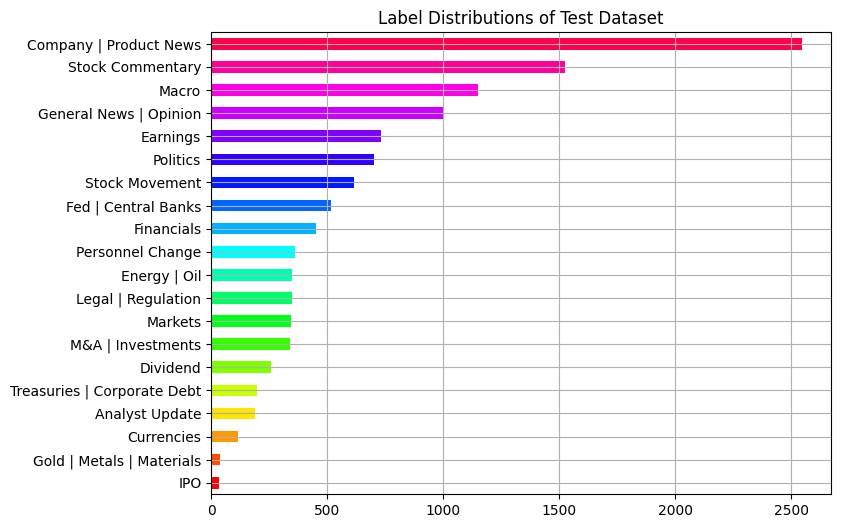

In [48]:
train_df['label'].map(label2topic).value_counts(ascending=True).plot(kind='barh', grid=True, color=rainbow_colors_hex, title='Label Distributions of Test Dataset', figsize=(8, 6))

In [49]:
max_lab = train_df['label'].value_counts().index[0]
n_lab = train_df['label'].value_counts().iloc[0]

print(f"Just predicting {max_lab} '{label2topic[max_lab]}' would yields accuaracy of:", n_lab / len(train_df))

Just predicting 2 'Company | Product News' would yields accuaracy of: 0.21537419573315272


As we can see here we dont have a particularly balanced dataset; the distribution appears to be non-linear. From the asymmetric histogram and the number of diffrent classes (20) we can assume that this is not a easy dataset to classify, simply because there are more possible outcomes and the model will be trained on orders of magnitude more examples of the more common classes than the less common ones. 

We also can see that just predicting the most common label yields a accuracy of ~0.21. 

In [50]:
pd.set_option('display.max_colwidth', 200)
train_df['text'].head(10)

0                                      Buy Las Vegas Sands as travel to Singapore builds, Wells Fargo says  https://t.co/fLS2w57iCz
1                     Piper Sandler downgrades DocuSign to sell, citing elevated risks amid CEO transition  https://t.co/1EmtywmYpr
2       Netflix and its peers are set for a ‘return to growth,’ analysts say, giving one stock 120% upside  https://t.co/jPpdl0D9s4
3                     Barclays believes earnings for these underperforming stocks may surprise Wall Street  https://t.co/PHbsyVGAyE
4                                Bernstein upgrades Alibaba, says shares can rally more than 20% from here  https://t.co/m3ApoPRGU0
5       Analysts react to Netflix's strong quarter, with some pointing to a potential bottom for the stock  https://t.co/cQngJsyefD
6       Morgan Stanley says these global stocks are set for earnings beats — and gives one over 45% upside  https://t.co/GeWxa5YoWr
7    Investing Club: Analysts dropped a bunch of new notes on energy stocks.

### Preprocessing Fuctions

In [51]:
from preprocessing import preprocess_tweet;

In [52]:
train_df['text_preprocessed'] = train_df['text'].apply(preprocess_tweet)
test_df['text_preprocessed'] = test_df['text'].apply(preprocess_tweet)
val_df['text_preprocessed'] = val_df['text'].apply(preprocess_tweet)

### Analyse Tweets structure

In [53]:
train_df['text_preprocessed'].head(10)

0                           buy las vega sand travel singapor build  well fargo say
1             piper sandler downgrad docusign sell  cite elev risk amid ceo transit
2    netflix peer set ‘ return growth   analyst say  give one stock <percent> upsid
3                    barclay believ earn underperform stock may surpris wall street
4                               bernstein upgrad alibaba  say share ralli <percent>
5                  analyst react netflix strong quarter  point potenti bottom stock
6          morgan stanley say global stock set earn beat — give one <percent> upsid
7                      invest club  analyst drop bunch new note energi stock  stand
8           cfra downgrad disney  say lack cash dividend could hurt stream platform
9                           bank america bullish jpmorgan  mean wall street economi
Name: text_preprocessed, dtype: object

The preprocessing has left us with a corpus of key stems. From visual inspection, there appears to be a lot of specialised language, which may prove difficult to classify - even using word embeddings from an LLM like BERT, which was trained on a much larger and more general corpus, and especially with the large number of classes.

We used plenty of preprocessing:

- We Converted Unicode Emojis to its categories
- we removed twitter links
- we changed twitter mentions to a token
- we removed stopwords
- we used stemming
- we removed special characters
- we converted unique ['percent', 'money', 'date'] to tokens

These techniques aid our visualizing the diffrent classes will be useful later for conventional machine learning methods like tf-idf and clustering

In [54]:
train_df['text_preprocessed'].duplicated().sum() # we still have a lot of duplicates, we want to drop these before continueing training

train_df = train_df.drop_duplicates(subset='text_preprocessed').reset_index(drop=True)

In [55]:
data = pd.read_pickle("saved_data/train_df.pkl")

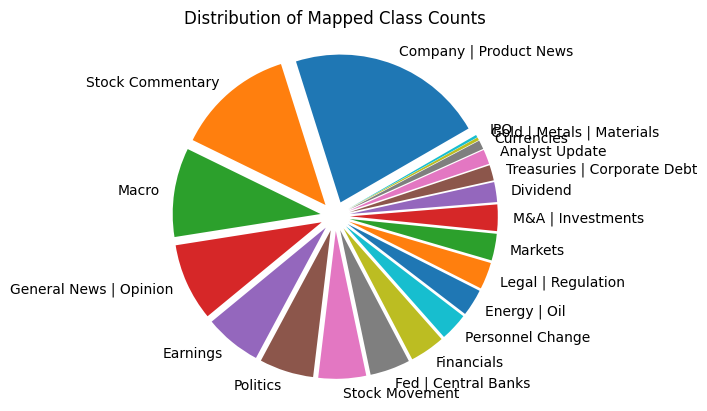

In [56]:
import matplotlib.pyplot as plt

mapped_class_counts = pd.Series(data['label'].map(label2topic)).value_counts()

plt.pie(mapped_class_counts, labels = mapped_class_counts.index, rotatelabels = False, explode = [0.1] * len(mapped_class_counts), startangle =30)
plt.title("Distribution of Mapped Class Counts")
plt.show()

### Class specific Token count Distributions

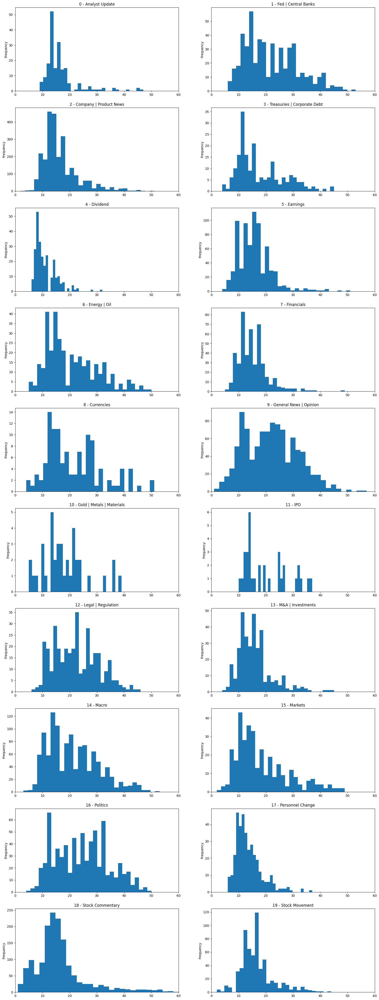

In [57]:
def plot_word_length(df, ax, title):
    data = df.copy()

    word_counts = [len(s.split()) for s in data['text']]
    data['token#'] = word_counts

    data['token#'].plot(kind='hist', bins=30, title=title, xlim=(0, 60), xlabel='Token Count', ylabel='Frequency', ax=ax)



fig, axes = plt.subplots(10, 2, figsize=(20, 55))

axes = axes.flatten()
for ax, label in zip(axes, label2topic.keys()):


    plot_word_length(data[data['label'] == label], ax, f'{label} - {label2topic[label]}')


plt.show()

There is some variation in the frequency of tokens in each class. We thought that, because Twitter sets a relatively small limit on number of characters, text length might be very homogenous. Although alone it provides insufficient information to classify accurately any of the tweets, it is important discriminatory information that may help the model. Even though BERT uses embeddings which truncates or pads long or short documents respectively, we expect sentence length to influence the classification process, since the level of syntatic and semantic complexity is likely correlated with sentence length. 

In [58]:
data['text_preprocessed'] = data['text'].apply(preprocess_tweet)

combined_text = ' '.join(data['text_preprocessed'])
pd.Series(combined_text.split(' ')).value_counts().head(20)

             23075
stock         7862
<number>      3789
<money>       1877
<percent>     1686
market        1455
us             889
<user>         807
new            788
earn           740
trade          698
announc        681
year           630
invest         630
busi           627
say            622
economi        614
quarter        591
price          585
report         573
dtype: int64

We anticipate that the frequency with which cross-class documents share these terms will make the classification task more difficult. These terms, if found in a more general text corpus, would likely be key indicators of a specialised dataset pertaining to finance. However, because all the classes share these specialised terms, it may be more difficult for the classifier to discriminate between them based on BERT's embeddings. 

### Class specific WordCloads

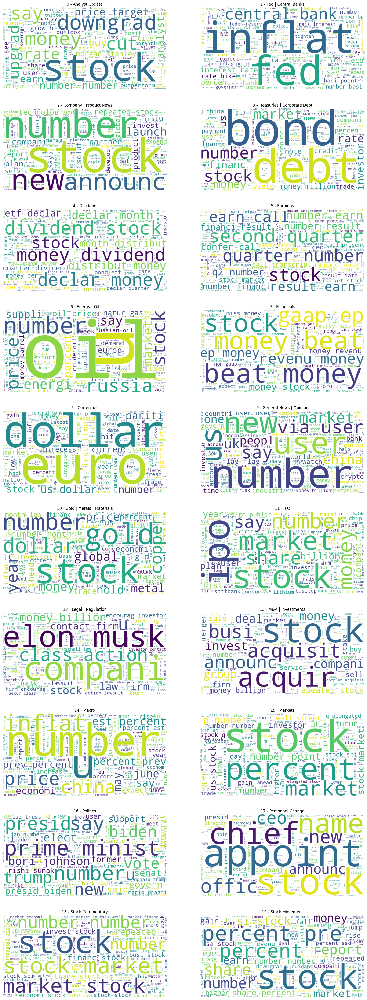

In [59]:
from wordcloud import WordCloud

def generate_wordcloud(text_data, axis, title):
    # Concatenate all preprocessed text data into a single string
    combined_text = ' '.join(text_data)

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)

    # Display the word cloud in the specified axis
    axis.imshow(wordcloud, interpolation='bilinear')
    axis.axis('off')
    axis.set_title(title)


fig, axes = plt.subplots(10, 2, figsize=(20, 55))
axes = axes.flatten()

for label, ax in zip(label2topic.keys(), axes):
    generate_wordcloud(data[data['label'] == label]['text_preprocessed'], ax, f'{label} - {label2topic[label]}')

fig.show()

Despite there being some words that are present in every class (like "stock"), there also appear to be words whose frequency is much greater in some classes than others, so they are likely good indicators. For example 'oil', unsuprisingly, is features extremely heavily in oil and energy tweets, but sparsely in other classes. This is good as it means the classes may be more distinct from one another than we initially thought. However, we still think that the model may struggle with classification because of the low number of words in each text. 

Assume, as is commmonplace in methods like LDA and STM, that the text is produced by a generative model. There are prespecified topic (class) proportions, and the words are drawn from the topic distribution probabilistically. Suppose a particular document is 81% oil and energy and the remaining 19% is distributed evenly amongst the remaining classes (1% each). If the text document were very long, we could be quite certain that enough words most associated with oil and energy would be drawn that, simply by counting the frequency of words, we could accurately classify the document. However, because the length of text in our corpus is very small, we can be less sure. We are only drawing a handful of words for each document, so the risk of an outlier containing more words from the other 19 topics is quite high. This may make classification more difficult. 

### 1.3 Random Classifier Performance <a id="part-1-3"></a>

Calculation and benchmarking of a random classifier's expected performance.

In [60]:
real_prior_dist = (train_df.label.value_counts() / len(train_df)).sort_index()

train_df['random'] = np.random.choice(real_prior_dist.index.to_list(), p=real_prior_dist.values, size=len(train_df))
test_df['random'] = np.random.choice(real_prior_dist.index.to_list(), p=real_prior_dist.values, size=len(test_df))
val_df['random'] = np.random.choice(real_prior_dist.index.to_list(), p=real_prior_dist.values, size=len(val_df))

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.06      0.05      0.05        62
        Fed | Central Banks       0.06      0.05      0.06       215
     Company | Product News       0.21      0.22      0.22       858
Treasuries | Corporate Debt       0.03      0.02      0.03        82
                   Dividend       0.02      0.02      0.02       102
                   Earnings       0.06      0.07      0.06       247
               Energy | Oil       0.02      0.02      0.02       124
                 Financials       0.05      0.06      0.05       155
                 Currencies       0.00      0.00      0.00        34
     General News | Opinion       0.10      0.10      0.10       375
  Gold | Metals | Materials       0.00      0.00      0.00        23
                        IPO       0.00      0.00      0.00         9
         Legal | Regulation       0.01      0.01      0.01       110
          

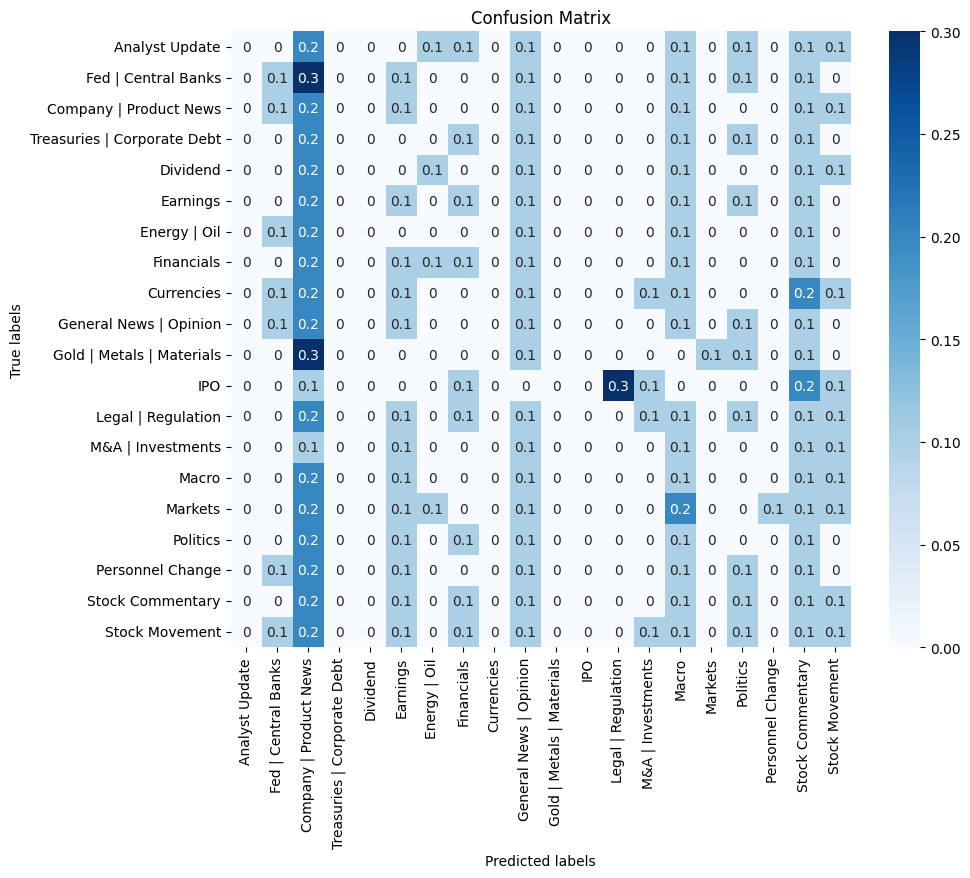

In [61]:
analyze(val_df, 'random')

Unsuprisingly, the evaluation metrics are low across the board, generally near 0.05 (1/20). However, the variance in performance is also quite large, presumably because of the class imbalance in our dataset.

### 1.4 Baseline Implementation <a id="part-1-4"></a>

Development and discussion of a rule-based classifier as a baseline.

In [62]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [63]:
tfidf = TfidfVectorizer(stop_words='english').fit(train_df['text_preprocessed'])

In [64]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

checkpoint = 'TF-IDF'

# Create a pipeline with TF-IDF and Logistic Regression
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english')),
    ('clf', LogisticRegression(solver='liblinear', class_weight='balanced')),
])

# Fit the pipeline on the training data
pipeline.fit(train_df['text_preprocessed'], train_df['label'])

train_df[checkpoint] = pipeline.predict_proba(train_df['text_preprocessed']).argmax(axis=1)
val_df[checkpoint] = pipeline.predict_proba(val_df['text_preprocessed']).argmax(axis=1)
test_df[checkpoint] = pipeline.predict_proba(test_df['text_preprocessed']).argmax(axis=1)

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.60      0.81      0.68        62
        Fed | Central Banks       0.81      0.82      0.81       215
     Company | Product News       0.81      0.75      0.78       858
Treasuries | Corporate Debt       0.75      0.73      0.74        82
                   Dividend       0.98      0.94      0.96       102
                   Earnings       0.89      0.92      0.90       247
               Energy | Oil       0.70      0.87      0.77       124
                 Financials       0.84      0.80      0.82       155
                 Currencies       0.48      0.65      0.55        34
     General News | Opinion       0.65      0.67      0.66       375
  Gold | Metals | Materials       0.82      0.78      0.80        23
                        IPO       0.73      0.89      0.80         9
         Legal | Regulation       0.78      0.85      0.81       110
          

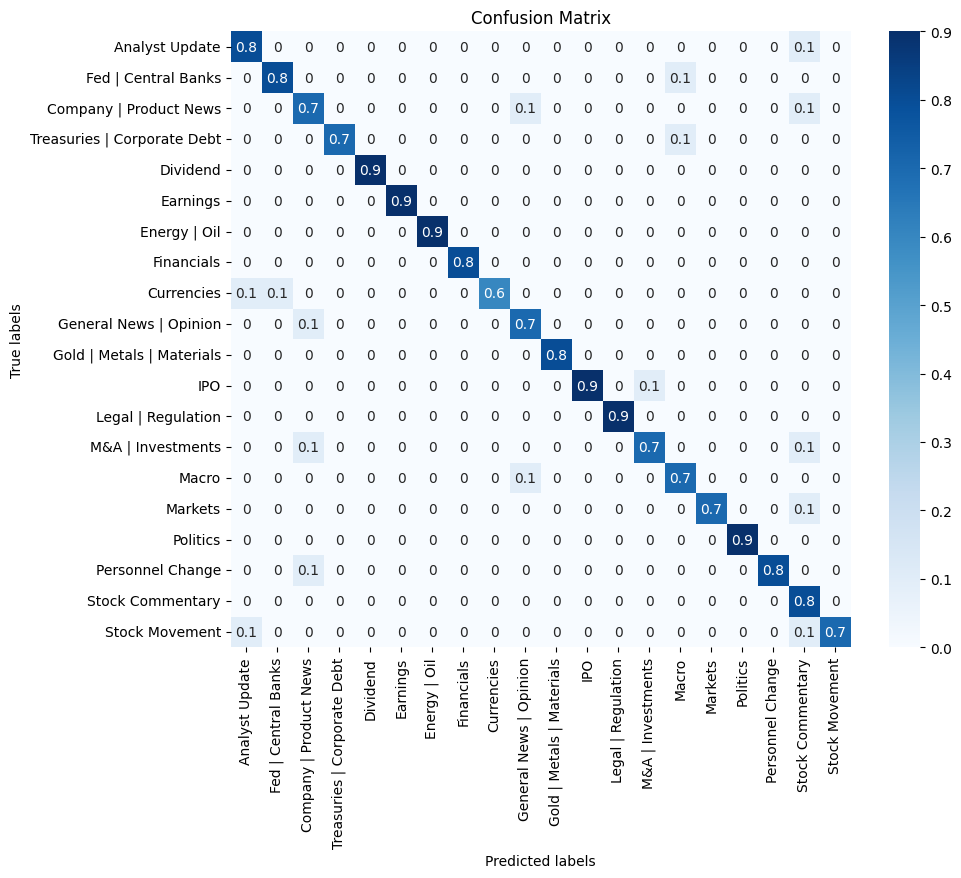

In [65]:
analyze(val_df, 'TF-IDF')

Logistic regression performs reasonably well on this dataset. While there is substantial variation in accuracy between the classes, it correctly classifies the tweets about 80% of the time. Interestingly, there doesn't seem to be a particularly large correlation between classes with a small number of training examples and classification performance. For instance, energy and oil have quite a small training set, but the model correctly classifies them 80% of the time. This is presumably because some classes are more technical (i.e., they use jargon indicative of their class) so they occupy a distinct pocket of the high-dimensional feature space, making them easy to demarcate. 


Here we use a rule-based classifier which does not use any form of feature extraction - it is a simple algorithm that applies prespecified rules blindly. Due to the complexity of natural language, we expect this classification model to perform poorly. To design a rule-based model whose performance rivals that of more sophisticated machine learning models, one would likely have to specify an extremely large number of rules to deal with all combiantions of words and edge cases. 

In [66]:
import spacy
from spacy.matcher import Matcher

nlp = spacy.load("en_core_web_sm")
matcher = Matcher(nlp.vocab)

In [67]:
analyst_update = [
    [{"LOWER": "stock"}],
    [{"LOWER": "analyst"}],
    [{"LOWER": "upgrad"}],
    [{"LOWER": "downgrad"}],
    [{"LOWER": "analyst call"}],
    [{"LOWER": "price target"}],
    [{"LOWER": "rate"}],
    [{"LOWER": "cut"}],
    [{"LOWER": "money"}]
]
company_product_news = [
    [{"LOWER": "compani"}],
    [{"LOWER": "new"}],
    [{"LOWER": "announc"}],
    [{"LOWER": "technolog"}],
    [{"LOWER": "number"}],
    [{"LOWER": "partner"}],
    [{"LOWER": "product"}],
    [{"LOWER": "plan"}]
]
currencies = [
    [{"LOWER": "euro"}],
    [{"LOWER": "dollar"}],
    [{"LOWER": "currenc"}],
    [{"LOWER": "us dollar"}],
    [{"LOWER": "pariti"}],
    [{"LOWER": "yuan"}],
    [{"LOWER": "indian rupe"}],
    [{"LOWER": "hike"}],
    [{"LOWER": "recess"}]
]
dividend = [
    [{"LOWER": "distribut money"}],
    [{"LOWER": "month distribut"}],
    [{"LOWER": "dividend stock"}],
    [{"LOWER": "etf declar"}],
    [{"LOWER": "per share"}],
    [{"LOWER": "dividend percent"}],
    [{"LOWER": "bond etf"}],
    [{"LOWER": "invesco"}]
]
earnings = [
    [{"LOWER": "q2 number"}],
    [{"LOWER": "second quarter"}],
    [{"LOWER": "quarter number"}],
    [{"LOWER": "number earn"}],
    [{"LOWER": "earn call"}],
    [{"LOWER": "quarter fiscal"}],
    [{"LOWER": "number financi"}]
]
energy_oil = [
    [{"LOWER": "russia"}],
    [{"LOWER": "oil"}],
    [{"LOWER": "natur gas"}],
    [{"LOWER": "brent crude"}],
    [{"LOWER": "gas price"}],
    [{"LOWER": "energi"}]
]
central_banks = [
    [{"LOWER": "interest rate"}],
    [{"LOWER": "central bank"}],
    [{"LOWER": "basi point"}],
    [{"LOWER": "ecb"}],
    [{"LOWER": "rate hike"}],
    [{"LOWER": "rate number"}],
    [{"LOWER": "european central"}],
    [{"LOWER": "rais interest"}]
]
financials = [
    [{"LOWER": "gaap"}],
    [{"LOWER": "beat money"}],
    [{"LOWER": "money beat"}],
    [{"LOWER": "revenu money"}],
    [{"LOWER": "money stock"}],
    [{"LOWER": "forecast"}],
    [{"LOWER": "growth"}]
]
general_news = [
    [{"LOWER": "user"}],
    [{"LOWER": "china"}],
    [{"LOWER": "countri"}],
    [{"LOWER": "heat wave"}],
    [{"LOWER": "flag"}],
    [{"LOWER": "citi"}],
    [{"LOWER": "uk"}],
    [{"LOWER": "ukrain"}]
]
gold_metals = [
    [{"LOWER": "gold"}],
    [{"LOWER": "copper"}],
    [{"LOWER": "tonn"}],
    [{"LOWER": "xauusd"}],
    [{"LOWER": "comdx metal"}],
    [{"LOWER": "settlement price"}],
    [{"LOWER": "nickel"}],
    [{"LOWER": "gld report"}]
]
ipo = [
    [{"LOWER": "ipo"}],
    [{"LOWER": "london"}],
    [{"LOWER": "go public"}],
    [{"LOWER": "volkswagen"}],
    [{"LOWER": "softbank"}],
    [{"LOWER": "compani"}],
    [{"LOWER": "porsch"}]
]
legal_regulation = [
    [{"LOWER": "class action"}],
    [{"LOWER": "elon musk"}],
    [{"LOWER": "contact firm"}],
    [{"LOWER": "money billion"}],
    [{"LOWER": "action lawsuit"}],
    [{"LOWER": "investor contact"}],
    [{"LOWER": "shareholder"}],
    [{"LOWER": "court"}],
    [{"LOWER": "law firm"}]
]
investments = [
    [{"LOWER": "acquir"}],
    [{"LOWER": "acquisit"}],
    [{"LOWER": "repeated stock"}],
    [{"LOWER": "busi"}],
    [{"LOWER": "compani"}],
    [{"LOWER": "complet acquisit"}],
    [{"LOWER": "merger"}],
    [{"LOWER": "healthcar"}],
    [{"LOWER": "equiti"}]
]
macro = [
    [{"LOWER": "china"}],
    [{"LOWER": "percent prev"}],
    [{"LOWER": "global"}],
    [{"LOWER": "econom growth"}],
    [{"LOWER": "last month"}],
    [{"LOWER": "export"}],
    [{"LOWER": "jobless claim"}],
    [{"LOWER": "india"}],
    [{"LOWER": "demand"}]
]
markets = [
    [{"LOWER": "nasdaq"}],
    [{"LOWER": "dow"}],
    [{"LOWER": "wall street"}],
    [{"LOWER": "investor"}],
    [{"LOWER": "stock"}],
    [{"LOWER": "stock sumrx"}],
    [{"LOWER": "spi stock"}],
    [{"LOWER": "economi stock"}]
]
personnel_change = [
    [{"LOWER": "ceo"}],
    [{"LOWER": "chief"}],
    [{"LOWER": "appoint"}],
    [{"LOWER": "join"}],
    [{"LOWER": "name"}],
    [{"LOWER": "board"}],
    [{"LOWER": "director"}],
    [{"LOWER": "promot"}],
    [{"LOWER": "hire"}],
    [{"LOWER": "manag"}],
    [{"LOWER": "group"}]
]
politics = [
    [{"LOWER": "prime minist"}],
    [{"LOWER": "democrat"}],
    [{"LOWER": "vote"}],
    [{"LOWER": "presid"}],
    [{"LOWER": "bori johnson"}],
    [{"LOWER": "trump"}],
    [{"LOWER": "biden"}],
    [{"LOWER": "candid"}],
    [{"LOWER": "former"}],
    [{"LOWER": "rishi sunak"}],
    [{"LOWER": "senat"}]
]
stock_comment = [
    [{"LOWER": "stock"}],
    [{"LOWER": "stock tsla"}],
    [{"LOWER": "stock amzn"}],
    [{"LOWER": "stock economi"}],
    [{"LOWER": "market"}],
    [{"LOWER": "spi stock"}],
    [{"LOWER": "price"}]
]
stock_movement = [
    [{"LOWER": "earn"}],
    [{"LOWER": "trade"}],
    [{"LOWER": "rise"}],
    [{"LOWER": "percent"}],
    [{"LOWER": "bitcoin"}],
    [{"LOWER": "ralli"}]
]
debt = [
    [{"LOWER": "debt"}],
    [{"LOWER": "bond"}],
    [{"LOWER": "yield"}],
    [{"LOWER": "treasuri yield"}],
    [{"LOWER": "borrow"}],
    [{"LOWER": "canadian bond"}]
]

In [68]:
matcher.add("Analyst Update", analyst_update)
matcher.add("Company | Product News", company_product_news)
matcher.add("Currencies", currencies)
matcher.add("Dividend", dividend)
matcher.add("Earnings", earnings)
matcher.add("Energy | Oil", energy_oil)
matcher.add("Fed | Central Banks", central_banks)
matcher.add("Financials", financials)
matcher.add("General News | Opinion", general_news)
matcher.add("Gold | Metals | Materials", gold_metals)
matcher.add("IPO", ipo)
matcher.add("Legal | Regulation", legal_regulation)
matcher.add("M&A | Investments", investments)
matcher.add("Macro", macro)
matcher.add("Markets", markets)
matcher.add("Personnel Change", personnel_change)
matcher.add("Politics", politics)
matcher.add("Stock Commentary", stock_comment)
matcher.add("Stock Movement", stock_movement)
matcher.add("Treasuries | Corporate Debt", debt)

The Spacy Matcher iterates over each comment, applies the matcher to find matches for each category, counts the occurrences of each category match, selects the category with the highest count, and assigns its numeric identifier to the corresponding position in the pred array. Finally, it prints the array of predicted categories

In [69]:
# Define a dictionary to map category labels to numeric identifiers
category_to_id = {value: key for key, value in label2topic.items()}
# Initialize pred array with NaN values
pred = np.full((len(data)), np.NaN,dtype=int)

# Process each comment and classify sentiment
for i, comment in enumerate(train_df['text_preprocessed']):
    doc = nlp(str(comment))
    matches = matcher(doc)

    # Initialize counters for each category
    category_counts = {category: sum(match[0] == nlp.vocab.strings[category] for match in matches) for category in category_to_id}


    # Find the category with the highest count
    max_category = max(category_counts, key=category_counts.get)

    # Assign the numeric identifier of the predicted category to pred
    pred[i] = category_to_id[max_category]

# Print the predictions
print(pred)

/usr/local/lib/python3.10/dist-packages/numpy/core/numeric.py:330: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')


[0 0 0 ... 2 2 0]


In [70]:
train_df["spacy"] = pred

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.03      0.86      0.06       189
        Fed | Central Banks       0.85      0.05      0.10       518
     Company | Product News       0.36      0.36      0.36      2544
Treasuries | Corporate Debt       0.66      0.35      0.46       199
                   Dividend       0.00      0.00      0.00       257
                   Earnings       0.00      0.00      0.00       733
               Energy | Oil       0.45      0.35      0.39       348
                 Financials       0.15      0.03      0.05       454
                 Currencies       0.37      0.66      0.47       116
     General News | Opinion       0.36      0.25      0.30      1001
  Gold | Metals | Materials       0.38      0.16      0.22        38
                        IPO       0.43      0.30      0.36        33
         Legal | Regulation       0.29      0.02      0.04       347
          

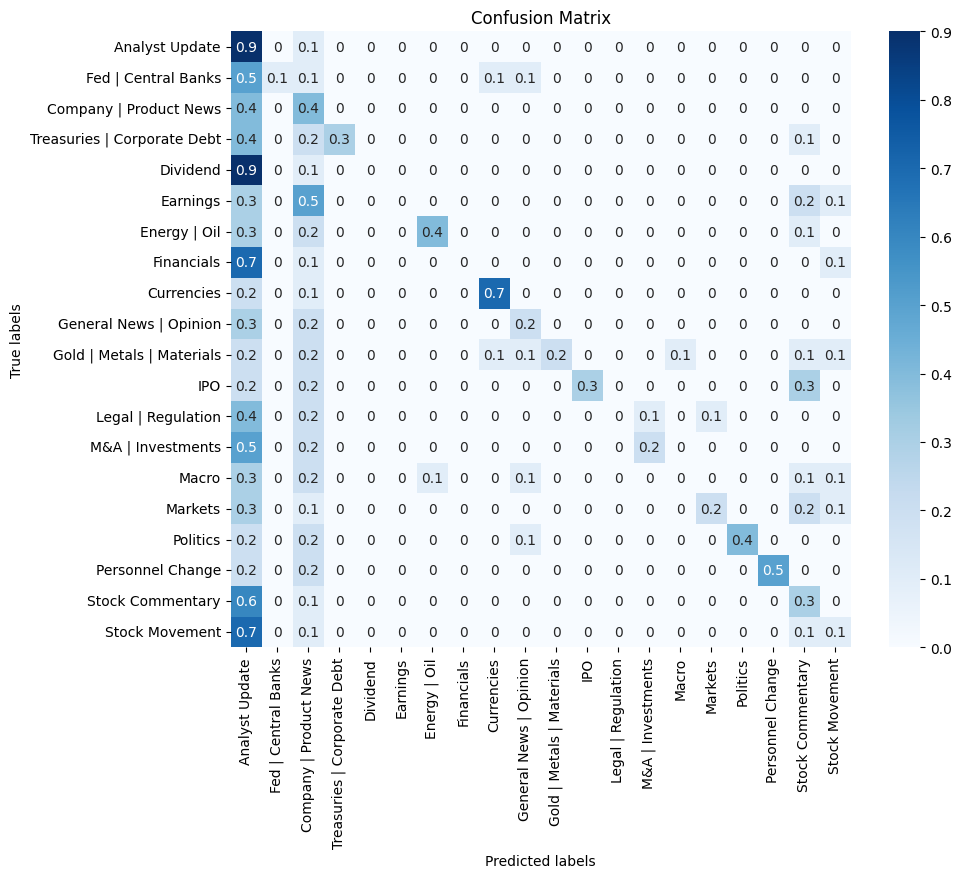

In [71]:
analyze(train_df,"spacy")

In general, the matcher performed well on classes with lots of documents, and worse on those with fewer documents. This is presumably because Spacy just counts words or phrases, and those classes with a large number of documents are likely to contain more matching words. This is a limitation of this approach. However, this correlation wasn't perfect - fed related tweets were the best classified but not the most frequent, which implies the rules we implemented happened to be best suited for picking up those kinds of tweets. This is another limitation of a rule-based approach. The researcher exerts significant influence over the classification, which can also introduce bias. 

---

# Part 2: Data Scientist Challenge <a id="part-2"></a>

### 2.1 BERT Model with Limited Data <a id="part-2-1"></a>

Training a BERT-based model using only 32 labeled examples. This type of learning is possible only with LLM infrastructure like BERT. The text is converted to pretrained embeddings, which have been trained on a very large corpus. This means the network is able to project each piece of text to a well-defined region of the high-dimensional feature space. If the archetypal training example from each class occupies a sufficiently distinct region of the feature space, the model should perform well, since there is little overlap between the classes in this space. However, if the classes occupy too similar a region of the feature space, they may be difficult to disambiguate without access to a far larger set of training examples. It seems likely that the latter case applies to our dataset since BERT was trained on a large and therefore general text database, but our task requires classification between texts from a specialised type of natural language (financial language). 

First we created a fuction to split our train dataset into 32 classified samples and unclassify the remaining smaples. We also ensured that every class is at least once contained in our dataset. In addition, we used the same class distribution of the train set for our 32 sample set to preserve the natural frequency in the dataset, since this same frequency will be encountered in the testing set. 

### Dataset Selection Fuction

In [26]:
def select_representative_dataset(parent_df: pd.DataFrame, n=None, frac=None, seed=50):
    """
    Selects n samples or a fraction frac of samples from a given dataset while maintaining the same distribution of labels.
    Ensures at least one sample from every class label is included in the selected dataframe.

    Args:
    - parent_df (pandas.DataFrame): The parent dataframe containing the dataset.
    - n (int): The number of samples to select. Default is 32.
    - frac (float): The fraction of samples to select. Default is None.

    Returns:
    - selected_df (pandas.DataFrame): The selected subset of the dataset.
    """


    subset = []

    # Ensure either n or frac is provided
    if n is None and frac is None:
        raise ValueError("Either 'n' or 'frac' must be provided.")

    # Calculate the number of samples to select for each label
    if (n is None) and (frac is not None):
        n = int(frac * len(parent_df))

    label_counts = parent_df['label'].value_counts()


    # Select at least one sample for each class label
    for label in label_counts.index:
        label_samples = parent_df[parent_df["label"] == label].sample(n=1, random_state=seed)
        subset.append(label_samples)

    # Calculate the remaining number of samples to select
    remaining_samples_count = n - len(subset)

    # If there are still remaining samples to select, sample from the whole dataset
    if remaining_samples_count > 0:
        sample = parent_df.sample(n=remaining_samples_count, random_state=seed)
        subset.append(sample)

    subset = pd.concat(subset)
    return subset[['text', 'text_preprocessed', 'label']].reset_index(), parent_df.drop(index=subset.index)[['text', 'text_preprocessed']].reset_index()


In [27]:
# train_data32, unclassified = select_representative_dataset(train_df, n=32)
# train_data32.to_pickle('saved_data/dataset_32_samples.pkl')
# unclassified.to_pickle('saved_data/unclassified_samples.pkl')

train_data32: pd.DataFrame = pd.read_pickle('saved_data/dataset_32_samples.pkl')
unclassified: pd.DataFrame = pd.read_pickle('saved_data/unclassified_samples.pkl')

We made sure to keep the train set indices to facilitate mapping the real labels back to this unclassified set if necessary

In [28]:
unclassified

,index,text,text_preprocessed
0,0,"Buy Las Vegas Sands as travel to Singapore builds, Wells Fargo says https://t.co/fLS2w57iCz","buy las vegas sands as travel to singapore builds , wells fargo says <url>"
1,1,"Piper Sandler downgrades DocuSign to sell, citing elevated risks amid CEO transition https://t.co/1EmtywmYpr","piper sandler downgrades docusign to sell , citing elevated risks amid <allcaps> ceo </allcaps> transition <url>"
2,2,"Netflix and its peers are set for a ‘return to growth,’ analysts say, giving one stock 120% upside https://t.co/jPpdl0D9s4","netflix and its peers are set for a ‘ return to growth , ’ analysts say , giving one stock <percent> upside <url>"
3,3,Barclays believes earnings for these underperforming stocks may surprise Wall Street https://t.co/PHbsyVGAyE,barclays believes earnings for these underperforming stocks may surprise wall street <url>
4,4,"Bernstein upgrades Alibaba, says shares can rally more than 20% from here https://t.co/m3ApoPRGU0","bernstein upgrades alibaba , says shares can rally more than <percent> from here <url>"
...,...,...,...
11813,11845,Lenders take control of Vue cinema chain in £1bn restructuring https://t.co/lteHYrOmbs,lenders take control of vue cinema chain in <money> restructuring <url>
11814,11846,China developers face $13bn wall of dollar bond payments in second half https://t.co/keZEowrpnf,china developers face <money> wall of dollar bond payments in second half <url>
11815,11847,KfW credit line for Uniper could be raised to 8 bln eur - Handelsblatt https://t.co/7R6tAf7Uvh https://t.co/MB3mYmgioL,kfw credit line for uniper could be raised to <number> bln eur - handelsblatt <url> <url>
11816,11848,Russian https://t.co/R0iPhyo5p7 sells 1 bln roubles at one-year repo auction https://t.co/ItClQUPQXd https://t.co/0Bk4mEHzKP,russian <url> sells <number> bln roubles at one - year repo auction <url> <url>


In [29]:
from train_bert import BertFinetuner

### Training Bert 32

In [100]:
tuner = BertFinetuner(train_data32, freeze_weights=False, epochs=5, drop_out=0.5, batch_size=32, lr=1e-03, weight_classes=False).train()

tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_transform.weight', 'vocab_layer_norm.weight', 'vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


Epoch 1/5
1/1 [==============================] - 27s 27s/step - loss: 3.3237 - recall: 0.0000e+00 - precision: 0.0000e+00
Epoch 2/5
1/1 [==============================] - 0s 98ms/step - loss: 3.2488 - recall: 0.0312 - precision: 1.0000
Epoch 3/5
1/1 [==============================] - 0s 98ms/step - loss: 4.0597 - recall: 0.0312 - precision: 0.2500
Epoch 4/5
1/1 [==============================] - 0s 93ms/step - loss: 3.2943 - recall: 0.0312 - precision: 0.3333
Epoch 5/5
1/1 [==============================] - 0s 93ms/step - loss: 3.5442 - recall: 0.0000e+00 - precision: 0.0000e+00


In [101]:
name = 'bert32'
train_df[name] = tuner.predict(train_df)
test_df[name] = tuner.predict(test_df)
val_df[name] = tuner.predict(val_df)

129/129 [==============================] - 7s 51ms/step


### Results

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.00      0.00      0.00        62
        Fed | Central Banks       0.00      0.00      0.00       215
     Company | Product News       0.27      0.05      0.08       858
Treasuries | Corporate Debt       0.00      0.00      0.00        82
                   Dividend       0.00      0.00      0.00       102
                   Earnings       0.00      0.00      0.00       247
               Energy | Oil       0.00      0.00      0.00       124
                 Financials       0.00      0.00      0.00       155
                 Currencies       0.00      0.00      0.00        34
     General News | Opinion       0.00      0.00      0.00       375
  Gold | Metals | Materials       0.00      0.00      0.00        23
                        IPO       0.00      0.00      0.00         9
         Legal | Regulation       0.00      0.00      0.00       110
          

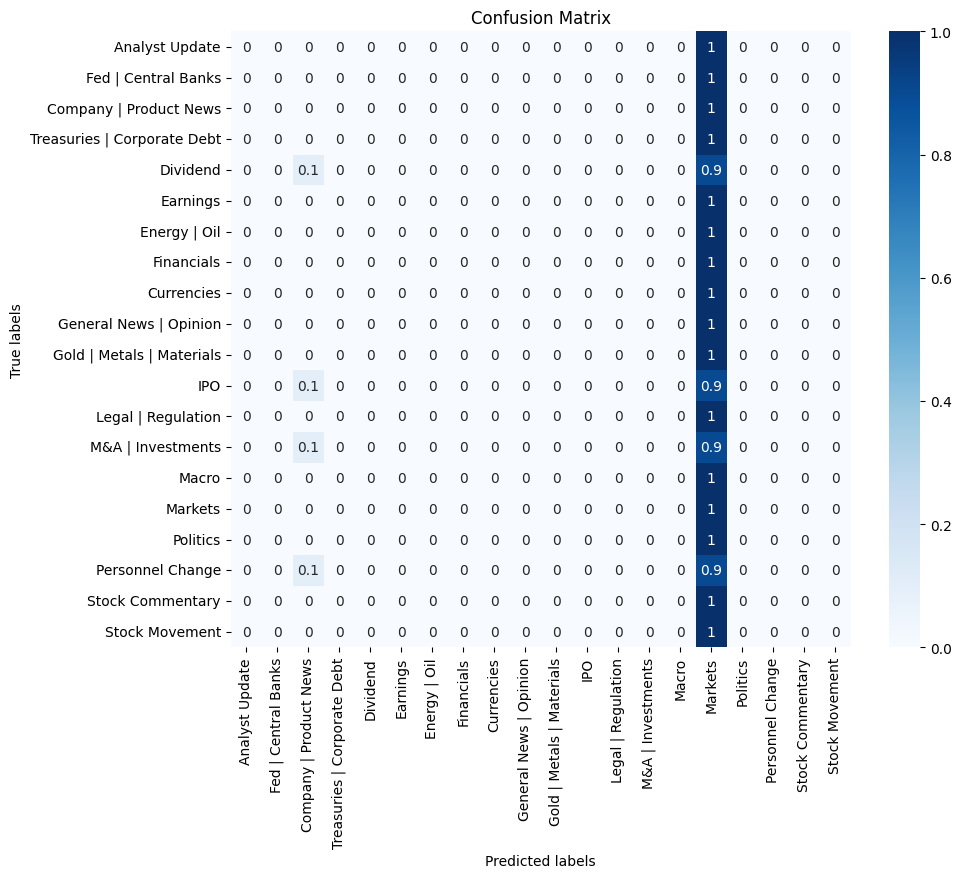

In [102]:
analyze(val_df, name)

With a very bad choice of hyperparameters, our BERT model performs very poorly, almost worst than the random classifier. Presumably this occurs because our dataset is comprised of technical language from similar fields, so BERT's feature space is insufficiently complex to separate the classes by a sufficiently great margin for few shot learning to work. 

Here we run into a dilema:

If our goal is to simulate a realistic datascience problem in which we really do only have 32 samples available, should we be allowed to adjust our hyperparameters based on the result of our test set with ~4000 samples?

In the real world we wouldn't be able to this, but we still went ahead with it, as we might still learn things that could help us make better prediction later. If we were presented with a dataset consisting of 4000 testing examples and only 32 training examples, we would just move a subset of the testing set to the training set to improve performance, so this seems like a fair comprimise. Additionally, 32 samples is especially low number of training samples given our 20 classes - almost all of the classes will be featured only once. 

### Training Tuned Bert 32

In [103]:
tuner = BertFinetuner(train_data32, freeze_weights=True, epochs=300, drop_out=0.6, batch_size=32, lr=1e-03, weight_classes=True).train()

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_transform.weight', 'vocab_layer_norm.weight', 'vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


Epoch 1/300
1/1 [==============================] - 12s 12s/step - loss: 3.3803 - recall_1: 0.0000e+00 - precision_1: 0.0000e+00
Epoch 2/300
1/1 [==============================] - 0s 49ms/step - loss: 3.2971 - recall_1: 0.0000e+00 - precision_1: 0.0000e+00
Epoch 3/300
1/1 [==============================] - 0s 51ms/step - loss: 3.4040 - recall_1: 0.0000e+00 - precision_1: 0.0000e+00
Epoch 4/300
1/1 [==============================] - 0s 49ms/step - loss: 3.0859 - recall_1: 0.0000e+00 - precision_1: 0.0000e+00
Epoch 5/300
1/1 [==============================] - 0s 49ms/step - loss: 3.5025 - recall_1: 0.0000e+00 - precision_1: 0.0000e+00
Epoch 6/300
1/1 [==============================] - 0s 51ms/step - loss: 3.0748 - recall_1: 0.0000e+00 - precision_1: 0.0000e+00
Epoch 7/300
1/1 [==============================] - 0s 48ms/step - loss: 3.3171 - recall_1: 0.0000e+00 - precision_1: 0.0000e+00
Epoch 8/300
1/1 [==============================] - 0s 49ms/step - loss: 3.1115 - recall_1: 0.0000e+00 - 

In [104]:
name = 'bert32_tuned'
train_df[name] = tuner.predict(train_df)
test_df[name] = tuner.predict(test_df)
val_df[name] = tuner.predict(val_df)

129/129 [==============================] - 4s 32ms/step


### Analysis

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.04      0.03      0.04        62
        Fed | Central Banks       0.38      0.24      0.30       215
     Company | Product News       0.59      0.50      0.54       858
Treasuries | Corporate Debt       0.07      0.16      0.10        82
                   Dividend       0.23      0.80      0.36       102
                   Earnings       0.37      0.11      0.16       247
               Energy | Oil       0.22      0.42      0.29       124
                 Financials       0.04      0.01      0.02       155
                 Currencies       0.19      0.29      0.23        34
     General News | Opinion       0.50      0.03      0.06       375
  Gold | Metals | Materials       0.01      0.09      0.02        23
                        IPO       0.00      0.00      0.00         9
         Legal | Regulation       0.30      0.35      0.33       110
          

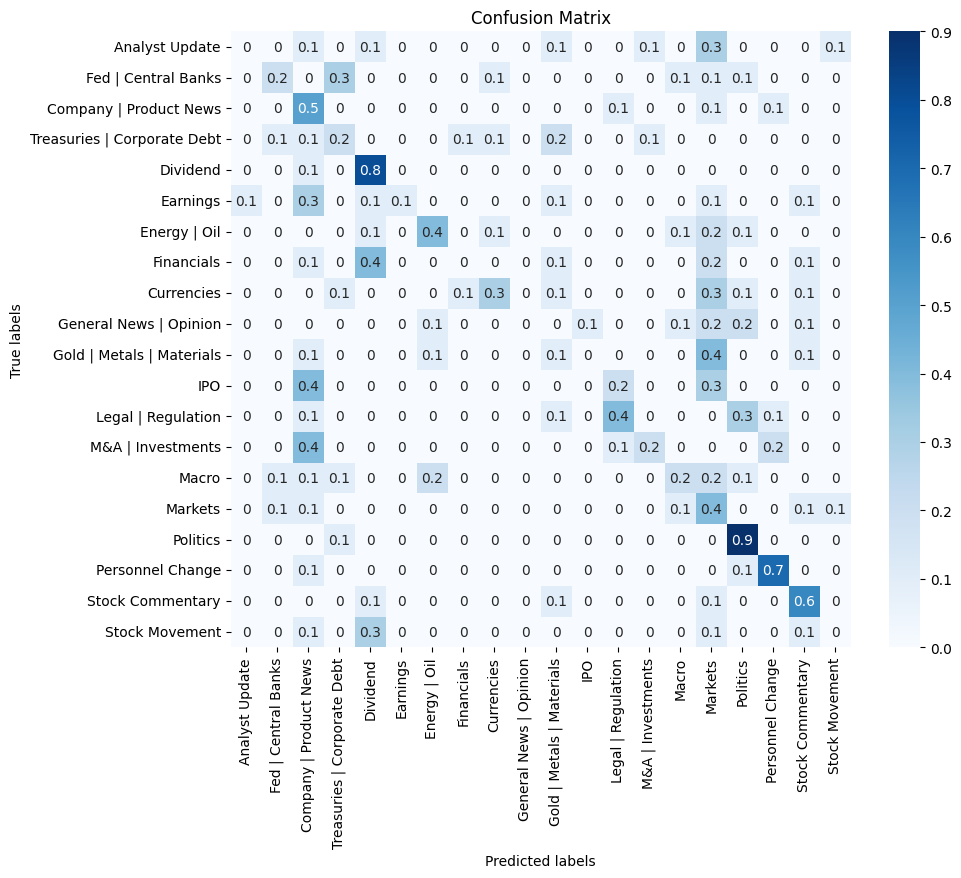

In [105]:
analyze(val_df, name)

Just with a minimal amount of finetuning we were able to get pretty good berformance out of our siple bert model, it now performs 4x better than random perdictions and given that we have so many lables and quite a hard dataset to classify thats actually quite impressive.

### 2.2 Dataset Augmentation <a id="part-2-2"></a>

Experimenting with techniques to increase dataset size and its impact on the model.

### First Approach:

Our fist idea was to use clustering or Topic Modeling. We will find 20 different clusters in the dataset, then classify the clusters with the right label using our 32 samples. We know that this approach might classify some clusters incorrectly, but we hope it would still give us some improvement, given the power of the pretrained bert weights. This approach is used widely in multilabel classification problems - various versions of YOLO (eg. YOLO V2 - Redmond & Farhadi, 2016) used K-means clustering to produce prototypical bounding box shapes that subsequently acted as on priors during bounding box fitting at testing. 

Unfortunately, we weren't able to classify the clusters successfully enough for the additional information to be useful during training. This implies the classes are all quite similar in terms of the words used in their composition, which is unsuprising given the specialised nature of the dataset. 

If we had more time, we would have liked to have clustered the embeddings produced by BERT. By clustering the embeddings directly, we might be able to capitalise on the feature extraction already performed by the LLM, which may have picked up on more subtle semantic meaning than simple statistical methods like TF-IDF. 

In [106]:
unclassified

,index,text,text_preprocessed
0,0,Buy Las Vegas Sands as travel to Singapore bui...,buy las vegas sands as travel to singapore bui...
1,1,"Piper Sandler downgrades DocuSign to sell, cit...","piper sandler downgrades docusign to sell , ci..."
2,2,Netflix and its peers are set for a ‘return to...,netflix and its peers are set for a ‘ return t...
3,3,Barclays believes earnings for these underperf...,barclays believes earnings for these underperf...
4,4,"Bernstein upgrades Alibaba, says shares can ra...","bernstein upgrades alibaba , says shares can r..."
...,...,...,...
11813,11845,Lenders take control of Vue cinema chain in £1...,lenders take control of vue cinema chain in <m...
11814,11846,China developers face $13bn wall of dollar bon...,china developers face <money> wall of dollar b...
11815,11847,KfW credit line for Uniper could be raised to ...,kfw credit line for uniper could be raised to ...
11816,11848,Russian https://t.co/R0iPhyo5p7 sells 1 bln r...,russian <url> sells <number> bln roubles at on...


### Clustering

In [107]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

# Create TF-IDF vectorizer
vectorizer = TfidfVectorizer(max_features=1000)
tfidf_matrix = vectorizer.fit_transform(unclassified['text_preprocessed'])

# Apply Gaussian Mixture Models for clustering
gmm = GaussianMixture(n_components=20)
gmm.fit(tfidf_matrix.toarray())

# Get cluster labels
cluster_labels = gmm.predict(tfidf_matrix.toarray())

real_labels = train_df.loc[unclassified['index'], 'label']

In [110]:
train_df.to_pickle('saved_data/train_df.pkl')
test_df.to_pickle('saved_data/test_df.pkl')
val_df.to_pickle('saved_data/val_df.pkl')

In [111]:
unclassified_tfidf = tfidf_matrix.toarray()

In [112]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA


# Apply PCA to reduce dimensionality
dim_reduc = TSNE(n_components=2)
pca_matrix = dim_reduc.fit_transform(tfidf_matrix.toarray())

### Visualize Clusters

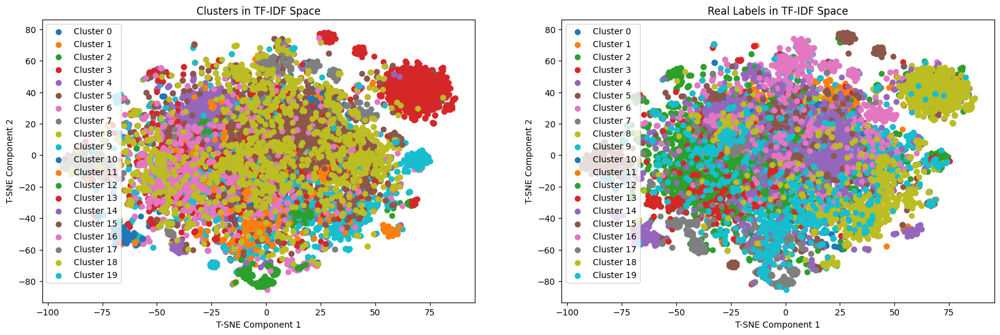

In [113]:
# Visualize clusters in the TF-IDF space using PCA
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Plot clusters with cluster_labels
for cluster in range(20):
    ax1.scatter(pca_matrix[cluster_labels == cluster, 0], pca_matrix[cluster_labels == cluster, 1], label=f'Cluster {cluster}')
ax1.set_xlabel('T-SNE Component 1')
ax1.set_ylabel('T-SNE Component 2')
ax1.set_title('Clusters in TF-IDF Space')
ax1.legend(loc='upper left')

# Plot clusters with real_labels
for cluster in range(20):
    ax2.scatter(pca_matrix[real_labels == cluster, 0], pca_matrix[real_labels == cluster, 1], label=f'Cluster {cluster}')
ax2.set_xlabel('T-SNE Component 1')
ax2.set_ylabel('T-SNE Component 2')
ax2.set_title('Real Labels in TF-IDF Space')
ax2.legend(loc='upper left')

plt.show()


Although PCA is only an approximation of the true relationship between the clusters, it is clear from this plot that the classes are highly overlapping in TF-IDF space. 

Just to get an idea how good our clustering is performing, we compare the clusters to the real labels. We can see here that the clustering performs reasonably well, though it is also obvious that basaed on distances alone, we might introduce a lot of noise into our BERT model with this method.

### Second Approach:

- Project all Unclassified Samples and 32 Classified Samples into an TF-IDF vector space

- Calculate the mean TF-IDF Vector over all CLASSIFIED Samples we have.

- Use Cosine Similarity to find the N most similar unclassified datapoints for every label


This is a continuation from our fist idea, with the goal to reduce the number of wrongly classified samples, with this we only use a small fractions of unclassified datapoints but we are making sure that these few samples have a high chance of actually beeing correctly classified.

In [114]:
n = 3

### Approach 2 Code

In [115]:
label2mean_vec = {}

# Step 1: Transform preprocessed text data into TF-IDF vectors
for lab in train_data32.label.value_counts().index:

    cut = train_data32[train_data32['label'] == lab]

    tfidf_vec = vectorizer.transform(cut['text_preprocessed']).toarray()

    mean_tfidf = tfidf_vec.mean(axis=0)

    label2mean_vec[lab] = mean_tfidf

In [116]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

top_n_vectors = {}

for label, mean_vec in label2mean_vec.items():
    # Calculate cosine similarities between mean_vec and unclassified_tfidf

    label_similarities = cosine_similarity(unclassified_tfidf, mean_vec.reshape(1, -1))


    # Find the indices of the top 10 most similar vectors
    top_n_indices = label_similarities.argsort(axis=0)[-n:][::-1].reshape(-1)

    top_n_vectors[label] = top_n_indices


In [117]:
data = []
for label, arr in top_n_vectors.items():
    close_comments_chunk = unclassified.iloc[arr].copy()

    close_comments_chunk['label'] = label

    data.append(close_comments_chunk)

augmented_data = pd.concat(data)

### Approach 2 Analysis

In [118]:
augmented_data.sample(n=10)

,index,text,text_preprocessed,label
2845,2851,Euro edges closer to dollar parity Latest ma...,euro edges closer to dollar parity latest mark...,8
8550,8573,MSCI Appoints Cristina Bondolowski as Chief Ma...,<allcaps> msci </allcaps> appoints cristina bo...,17
20,21,Here are Friday's biggest analyst calls of the...,here are friday ' s biggest analyst calls of t...,0
11759,11791,US investors are increasingly wary of greenwas...,us investors are increasingly wary of greenwas...,6
3357,3364,Diodes Incorporated to Announce Second Quarter...,diodes incorporated to announce second quarter...,5
6489,6504,BREAKING: Company can fast track its lawsuit a...,<allcaps> breaking </allcaps> : company can fa...,12
1300,1301,Vega C Successfully Completed Its Maiden Fligh...,vega c successfully completed its maiden fligh...,13
3077,3084,$GEL - Genesis Energy declares $0.15 dividend ...,stock gel - genesis energy declares <money> di...,4
1359,1360,FLEETCOR® Ranked Among Fortune 1000 and Forbes...,<allcaps> fleetcor </allcaps> ® ranked among f...,6
715,716,New Travel Membership Platform VIP Traveler La...,new travel membership platform <allcaps> vip <...,9


Now we have 200 additional lables we can use for training, but the problem is, if our 32 original samples contain outliers, we will just introduce an even greater bias with all these new datapoints. The performance of the model will depend on how representative the original samples were of their class, which is a gamble that will not produce results every time, but may be effective most of the time. This could be especially damaging for the less common classes that feature only one example (recall we preserved the natural frequency of the classes when selecting the samples). 
 
We reasoned that, with a little more data and still keeping the bert weights frozen, we will be able to achieve better performance simply because we are leveraging better the knowledge in our pretrained BERT model.

In [119]:
total_data = pd.concat([train_data32, augmented_data])

In [120]:
total_data.duplicated('text_preprocessed').sum()

0

In [121]:
pd.set_option('display.max_colwidth', 80)

total_data[total_data.duplicated('text_preprocessed', keep=False)]

,index,text,text_preprocessed,label


We have duplicates here presumably because this comment is close to 2 diffrent tweets in our 32 sample datataset, but we decided to keep these samples in the hope that it will be averaged out in the final prediction, and prevent some overfitting.

### Training Augmented Bert

In [122]:
tuner = BertFinetuner(total_data, freeze_weights=True, epochs=300, drop_out=0.6, batch_size=32, lr=1e-03, weight_classes=True).train()

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_transform.weight', 'vocab_layer_norm.weight', 'vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


Epoch 1/300
2/2 [==============================] - 8s 48ms/step - loss: 3.4003 - recall_2: 0.0000e+00 - precision_2: 0.0000e+00
Epoch 2/300
2/2 [==============================] - 0s 45ms/step - loss: 3.0191 - recall_2: 0.0000e+00 - precision_2: 0.0000e+00
Epoch 3/300
2/2 [==============================] - 0s 41ms/step - loss: 3.3776 - recall_2: 0.0000e+00 - precision_2: 0.0000e+00
Epoch 4/300
2/2 [==============================] - 0s 44ms/step - loss: 3.1673 - recall_2: 0.0000e+00 - precision_2: 0.0000e+00
Epoch 5/300
2/2 [==============================] - 0s 45ms/step - loss: 3.1455 - recall_2: 0.0000e+00 - precision_2: 0.0000e+00
Epoch 6/300
2/2 [==============================] - 0s 41ms/step - loss: 3.2207 - recall_2: 0.0000e+00 - precision_2: 0.0000e+00
Epoch 7/300
2/2 [==============================] - 0s 42ms/step - loss: 3.0775 - recall_2: 0.0000e+00 - precision_2: 0.0000e+00
Epoch 8/300
2/2 [==============================] - 0s 41ms/step - loss: 3.2546 - recall_2: 0.0000e+00 - 

In [123]:
name = 'bert32_cos_similar'
train_df[name] = tuner.predict(train_df)
test_df[name] = tuner.predict(test_df)
val_df[name] = tuner.predict(val_df)

129/129 [==============================] - 5s 35ms/step


### Analysis Augmented Bert

In [124]:
train_df.to_pickle('saved_data/train_df.pkl')
test_df.to_pickle('saved_data/test_df.pkl')
val_df.to_pickle('saved_data/val_df.pkl')

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.07      0.08      0.07        62
        Fed | Central Banks       0.41      0.23      0.30       215
     Company | Product News       0.71      0.34      0.46       858
Treasuries | Corporate Debt       0.00      0.01      0.01        82
                   Dividend       0.33      0.67      0.44       102
                   Earnings       0.73      0.39      0.51       247
               Energy | Oil       0.07      0.13      0.09       124
                 Financials       0.16      0.23      0.19       155
                 Currencies       0.18      0.47      0.26        34
     General News | Opinion       0.35      0.12      0.18       375
  Gold | Metals | Materials       0.01      0.13      0.02        23
                        IPO       0.00      0.00      0.00         9
         Legal | Regulation       0.58      0.45      0.51       110
          

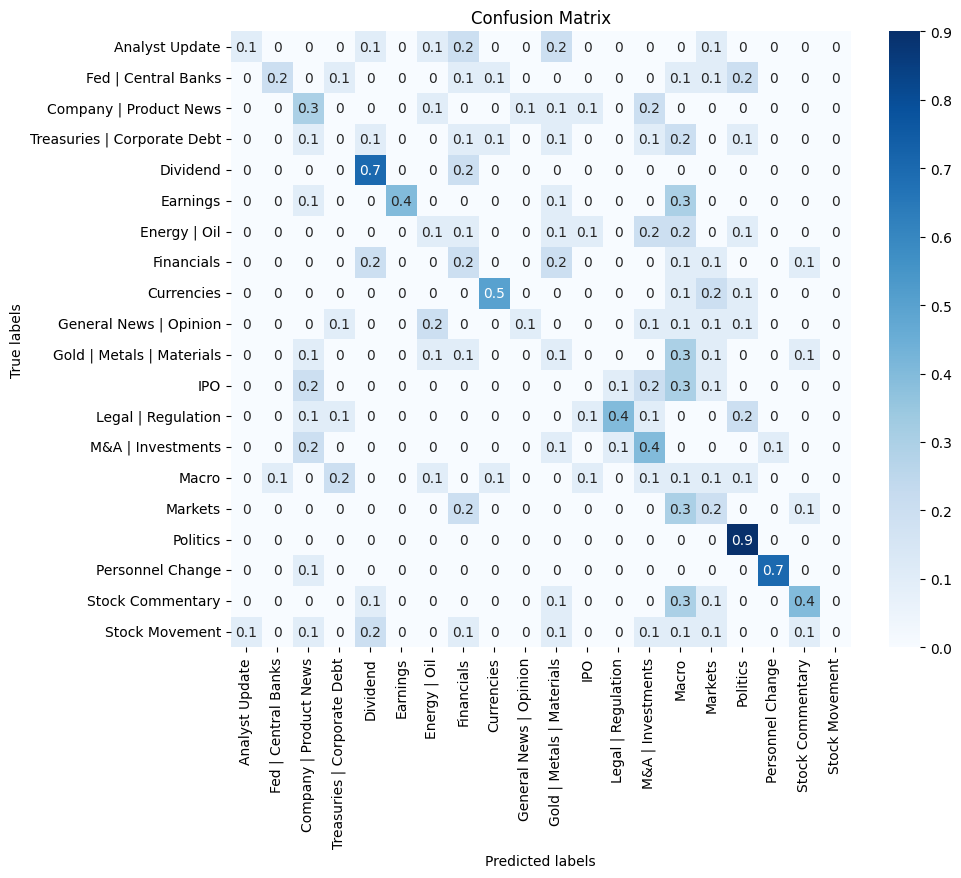

In [125]:
analyze(val_df, name)

It seems like adding the most similar samples from the unclassified dataset doesn't really ammount to any performance gains. We think the main problem is the unbalenced nature of the dataset so, especially for the low occurence classes, the new samples we added are often misclassified. 

It is possible that playing around with the hyperparameters and the number of additional similar vectors could improve performance, but testing over and over again on a validation set with 3000 samples also doesn't seem right when trying to simulate model performance on only 32 Samples. 

In [126]:
augmented_data['real_label'] = train_df.loc[augmented_data['index'], 'label'].values

In [127]:
# Accuracy of Augmented Dataset
print('Mean Label correctness of augmented data:', (augmented_data['real_label'] == augmented_data['label']).mean())

Mean Label correctness of augmented data: 0.6


In [128]:
augmented_data.sample(n=10)

,index,text,text_preprocessed,label,real_label
11097,11128,Cintas outperforms on down day following #earnings $MRNA $SPY $QQQ $DIA $SPX...,cintas outperforms on down day following <hashtag> earnings </hashtag> stock...,18,19
4386,4395,The Federal Reserve needs to be more aggressive this year to help cool down ...,the federal reserve needs to be more aggressive this year to help cool down ...,1,1
7409,7427,"$WYNMF $WYNMY $WYNN - China eyes reopening international travel, aiding casi...",stock wynmf stock wynmy stock wynn - china eyes reopening international trav...,9,14
3927,3936,"$UGA $XB1:COM $NRGU - California pump prices slip below $6, part of nationwi...",stock uga stock xb1 : <allcaps> com </allcaps> stock nrgu - california pump ...,10,6
11005,11035,"Stocks making the biggest moves premarket: AT&amp;T, DR Horton, Travelers an...","stocks making the biggest moves premarket : at & t , dr horton , travelers a...",19,19
11759,11791,"US investors are increasingly wary of greenwashing, according to the second ...","us investors are increasingly wary of greenwashing , according to the second...",6,3
715,716,New Travel Membership Platform VIP Traveler Launches Game-Changing Travel Fi...,new travel membership platform <allcaps> vip </allcaps> traveler launches ga...,9,2
8160,8178,Recent downturn with selling bias $XLE $CL_F $SPY $QQQ $DIA $SPX $COMPQ $DJI...,recent downturn with selling bias stock xle stock cl_f stock spy stock q <el...,18,15
5130,5141,IG Group beats profit estimates as market volatility boosts trading https:/...,ig group beats profit estimates as market volatility boosts trading <url> <url>,7,7
4864,4874,Citigroup beats estimates as trading strength offsets drop in dealmaking ht...,citigroup beats estimates as trading strength offsets drop in dealmaking <url>,7,7


Here we added 40% noise to the data, which decreses model performance a little. If it were possible to find similar samples with high accuracy, this would likely be an effective technique, as it forces the model to learn distinct representations for each. However, given we are classifying into 20 labels, the noise may just confound the process, rather than helping, since a more distinct representation may encourage the model to classify one sample differently from another very similar sample, but it may do nothing to help the model choose the correct class out of the ramining 19. If this were a binary class problem, we think we would likely see performance gains. 

### 2.3 Zero-Shot Learning with LLM <a id="part-2-3"></a>

Application and performance documentation of a zero-shot learning setup using a large language model.

For the Zero shot lerning we used the OpenAI API to qerry GPT3.5-Turbo for results.
We provided GPT3.5 with all the available classes and its corresponding lables. In this step we didn't use the 32 samples available, just the class names, an example for the query is given below:


## Query Example
#####################################################################

You are an LLM Zero Shot Classification engine. You are provided with 32 Samples of tweets, each tweet is labeled with one of the following 20 labels:

Lable: 0 - "Analyst Update":


Lable: 1 - "Fed | Central Banks":


Lable: 2 - "Company | Product News":


Lable: 3 - "Treasuries | Corporate Debt":


[...]


Lable: 19 - "Stock Movement":



Always give 3 Possible class lables of [TWEET TO CLASSIFY], ordered by its likelyhood score (percent) (descending)!
The output has to look like this:

[Sample Output]:

[{"score": [score], "label": 2, "topic": "Company | Product News"},

 {"score": [score], "label": 1, "topic": "Fed | Central Banks"},

 {"score": [score], "label": 10, "topic": "Gold | Metals | Materials"}]

 #####################################################################

We tried to be as clear as possible with the query, as prompt specification can improve model performance drastically. 

In [40]:
from zero_shot_lerning import ZeroShotLearner


api_key = open("openai_key.txt").read().strip()
learner = ZeroShotLearner(api_key, train_data32, verbose=False, few_shot=False)

In [41]:
import json
def gpt2score(str):
    try:
        return int(json.loads(str)[0]['label'])
    except:
        return 999

In [42]:
test_df['gpt_response'] = learner.predict(test_df)
test_df['zero_shot_gpt'] = test_df['gpt_response'].apply(gpt2score)

100%|██████████| 4117/4117 [2:05:03<00:00,  1.82s/it]


In [45]:
val_df['gpt_response'] = learner.predict(val_df)b

100%|██████████| 4117/4117 [00:00<00:00, 126737.24it/s]


In [46]:
val_df['zero_shot_gpt'] = val_df['gpt_response'].apply(gpt2score)

In [47]:
train_df.to_pickle('saved_data/train_df.pkl')
test_df.to_pickle('saved_data/test_df.pkl')
val_df.to_pickle('saved_data/val_df.pkl')

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.20      0.10      0.13        73
        Fed | Central Banks       0.58      0.81      0.68       214
     Company | Product News       0.59      0.70      0.64       845
Treasuries | Corporate Debt       0.51      0.43      0.46        77
                   Dividend       0.84      0.93      0.88        97
                   Earnings       0.55      0.96      0.70       242
               Energy | Oil       0.49      0.89      0.63       146
                 Financials       0.24      0.05      0.08       159
                 Currencies       0.65      0.75      0.70        32
     General News | Opinion       0.64      0.27      0.38       335
  Gold | Metals | Materials       0.12      0.92      0.22        13
                        IPO       0.38      0.79      0.51        14
         Legal | Regulation       0.74      0.50      0.59       117
          

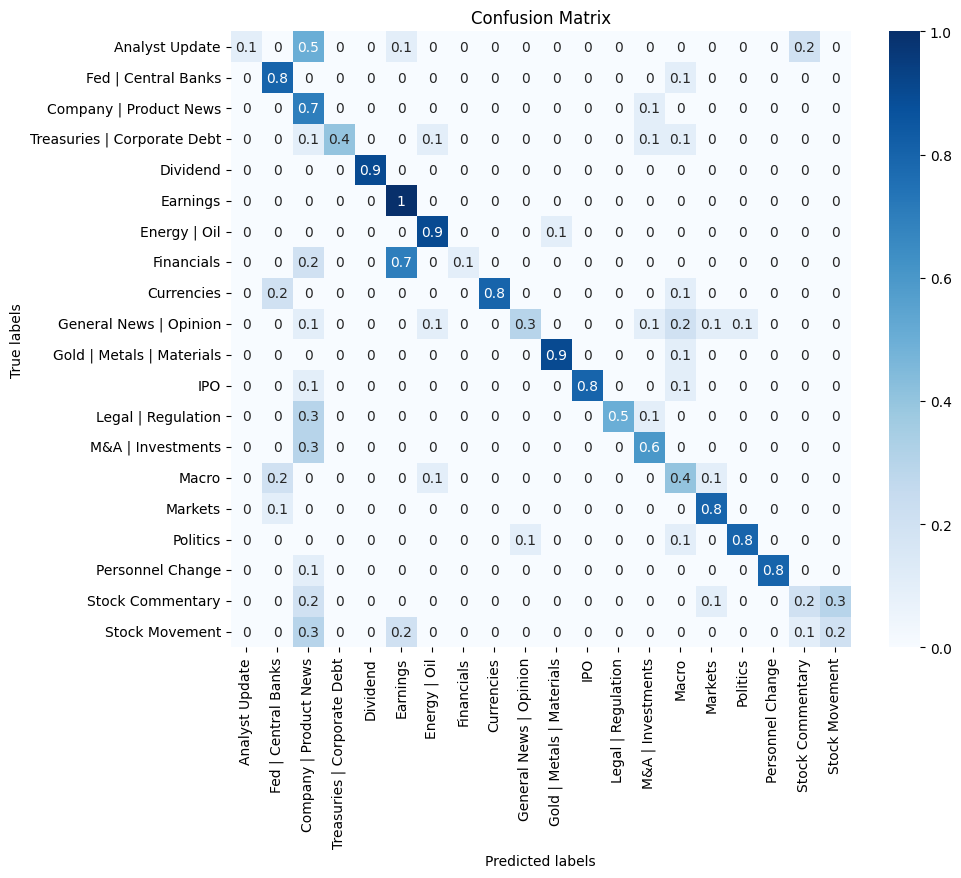

In [48]:
analyze(test_df.dropna(), 'zero_shot_gpt')

Overall, the zero shot model was impressively successful. Even for those classes that were underrepresented in the data, precision was reasonably high (0.38 for IPOs, which has the lowest number of samples). 

Zero Shot Summary:
    
Pros:
- Very good performance given that only 32 datapoints where used
- No finetuning with validation set is required (in real live if you have only 32 datapoint validation is very hard)
- fast to implement

Cons:
- prediction time (might be improved when running local LLMs)
- cost 25$ (might be improved when running local LLMs)

### 2.4 Data Generation with LLM <a id="part-2-4"></a>

Generating new labeled dataset points with a large language model and analyzing the impact. In this section, we use the zero-shot learner to predict the labels of the unclassified data, then use the classified data to train another BERT-based LLM. We used the same classes as in the Zero-shot example, but also gave GPT3.5-Turbo access to all 32 class labels that had already been classified.

## Query Example
#####################################################################

You are an LLM Zero Shot Classification engine. You are provided with 32 Samples of tweets, each tweet is labeled with one of the following 20 labels:

Lable: 0 - "Analyst Update":
	"AM Best Revises Outlooks to Positive for Frank Winston Crum Insurance Company  https://t.co/EmZy6sevSL  https://t.co/NeBRmF4EZS"


Lable: 3 - "Treasuries | Corporate Debt":
	"$HTGM - HTG Molecular Diagnostics amends senior loan facility  https://t.co/OUa4zlQlQ0"


[...]


Lable: 19 - "Stock Movement":
	"West Fraser $WFG big pop pre-market on Reuters report of potential PE-bid  Nov. 90 calls stood out on 7/11, but also name liked and wrote up last year  https://t.co/AWFvHvzu47"




Always give 3 Possible class lables of [TWEET TO CLASSIFY], ordered by its likelyhood score (percent) (descending)!
The output has to look like this:




[Sample Output]:

[{"score": [score], "label": 2, "topic": "Company | Product News"},

 {"score": [score], "label": 1, "topic": "Fed | Central Banks"},

 {"score": [score], "label": 10, "topic": "Gold | Metals | Materials"}]

 #####################################################################

In [ ]:
api_key = open("openai_key.txt").read().strip()
learner = ZeroShotLearner(api_key, train_data32, verbose=False, few_shot=True)

In [ ]:
# train_df['gpt_response'] = learner.predict(train_df)
# train_df['zero_shot'] = train_df['gpt_response'].apply(gpt2score)

100%|██████████| 11850/11850 [7:18:51<00:00,  2.22s/it]  


In [39]:
unclassified

,index,text,text_preprocessed
0,0,Buy Las Vegas Sands as travel to Singapore bui...,buy las vegas sands as travel to singapore bui...
1,1,"Piper Sandler downgrades DocuSign to sell, cit...","piper sandler downgrades docusign to sell , ci..."
2,2,Netflix and its peers are set for a ‘return to...,netflix and its peers are set for a ‘ return t...
3,3,Barclays believes earnings for these underperf...,barclays believes earnings for these underperf...
4,4,"Bernstein upgrades Alibaba, says shares can ra...","bernstein upgrades alibaba , says shares can r..."
...,...,...,...
11813,11845,Lenders take control of Vue cinema chain in £1...,lenders take control of vue cinema chain in <m...
11814,11846,China developers face $13bn wall of dollar bon...,china developers face <money> wall of dollar b...
11815,11847,KfW credit line for Uniper could be raised to ...,kfw credit line for uniper could be raised to ...
11816,11848,Russian https://t.co/R0iPhyo5p7 sells 1 bln r...,russian <url> sells <number> bln roubles at on...


In [48]:
name = 'gpt3.5_bert'

In [44]:
# becuase we used gpt3.5 on our train_df we map the few_shot results to our anclassified df as lables
unclassified['label'] = train_df.loc[unclassified['index'].values, 'few_shot_gpt'].values

In [45]:
# we combine it with our 32 correct samples
gpt_dataset = pd.concat([train_data32, unclassified]).reset_index(drop=True)

In [46]:
gpt_dataset

,index,text,text_preprocessed,label
0,1671,Franklin Templeton to Rename U.S. ETF Platform...,franklin templeton to rename u.s. <allcaps> et...,2
1,9577,#Growth outpacing #value #stocks $XLV $RAG $RA...,<hashtag> growth </hashtag> outpacing <hashtag...,18
2,7017,Global #supplychain pressures declined in June...,global <hashtag> supply chain </hashtag> press...,14
3,6154,Nordic insurer Tryg says long-haul travel more...,nordic insurer tryg says long - haul travel mo...,9
4,3473,Tandem Diabetes Care to Announce Second Quarte...,tandem diabetes care to announce second quarte...,5
...,...,...,...,...
11845,11845,Lenders take control of Vue cinema chain in £1...,lenders take control of vue cinema chain in <m...,13
11846,11846,China developers face $13bn wall of dollar bon...,china developers face <money> wall of dollar b...,3
11847,11847,KfW credit line for Uniper could be raised to ...,kfw credit line for uniper could be raised to ...,2
11848,11848,Russian https://t.co/R0iPhyo5p7 sells 1 bln r...,russian <url> sells <number> bln roubles at on...,3


Now we have the samples, we build and train the classifier

### Bert + GPT3.5 Training

In [51]:
tuner = BertFinetuner(gpt_dataset, batch_size=16, max_length=100, weight_classes=True,
                      freeze_weights=False, epochs=7, lr=2e-05, drop_out=0.6, beta1=0.9, beta2=0.999, epsilon=1e-08).train()

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_layer_norm.bias', 'vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


Epoch 1/7
740/740 [==============================] - 145s 168ms/step - loss: 1.8106 - recall_2: 0.2896 - precision_2: 0.7600
Epoch 2/7
740/740 [==============================] - 125s 168ms/step - loss: 0.9208 - recall_2: 0.5763 - precision_2: 0.7745
Epoch 3/7
740/740 [==============================] - 126s 170ms/step - loss: 0.6181 - recall_2: 0.6872 - precision_2: 0.8083
Epoch 4/7
740/740 [==============================] - 125s 170ms/step - loss: 0.4019 - recall_2: 0.7719 - precision_2: 0.8454
Epoch 5/7
740/740 [==============================] - 125s 169ms/step - loss: 0.2805 - recall_2: 0.8299 - precision_2: 0.8792
Epoch 6/7
740/740 [==============================] - 126s 170ms/step - loss: 0.1983 - recall_2: 0.8754 - precision_2: 0.9053
Epoch 7/7
740/740 [==============================] - 126s 170ms/step - loss: 0.1397 - recall_2: 0.9048 - precision_2: 0.9252


In [52]:
train_df[name] = tuner.predict(train_df)
test_df[name] = tuner.predict(test_df)
val_df[name] = tuner.predict(val_df)

129/129 [==============================] - 14s 105ms/step


### Bert Performance trained on LLM Data:

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.23      0.38      0.29        73
        Fed | Central Banks       0.63      0.66      0.65       214
     Company | Product News       0.73      0.65      0.69       852
Treasuries | Corporate Debt       0.52      0.56      0.54        77
                   Dividend       0.85      0.97      0.90        97
                   Earnings       0.70      0.93      0.80       242
               Energy | Oil       0.49      0.88      0.63       146
                 Financials       0.34      0.30      0.32       160
                 Currencies       0.45      0.91      0.60        32
     General News | Opinion       0.57      0.26      0.36       336
  Gold | Metals | Materials       0.10      0.85      0.17        13
                        IPO       0.47      1.00      0.64        14
         Legal | Regulation       0.50      0.73      0.59       119
          

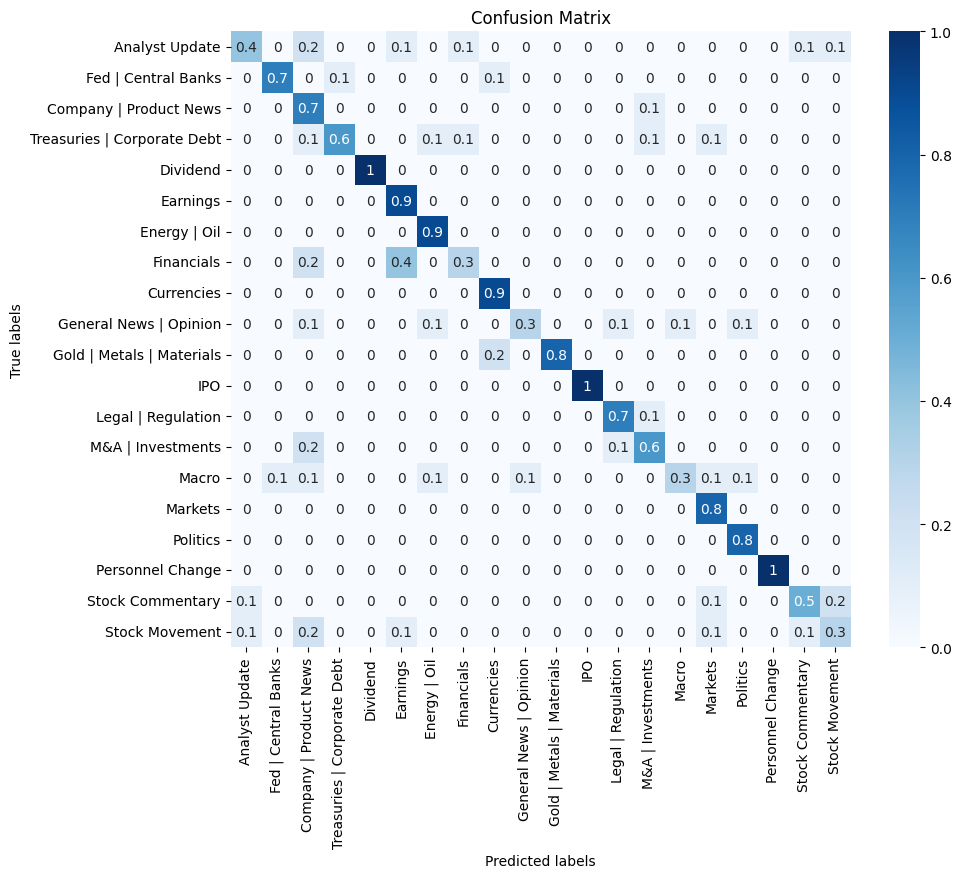

In [55]:
analyze(test_df, name)

The Bert model that was trained on the generated labels performs a little better than the just the few shot gpt model, and even better than the zero shot classifictaion. However, the improvement is quite marginal. The biggest improvement came from the underrepresented classes. For example, IPOs exhibited a 10% improvement on the zero shot classifier. This analysis demonstrates that sample generation with generative language model is an effective strategy to improve training. 

### Few shot GPT3.5-Turbo Performance

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.20      0.10      0.13        73
        Fed | Central Banks       0.58      0.81      0.68       214
     Company | Product News       0.59      0.70      0.64       845
Treasuries | Corporate Debt       0.51      0.43      0.46        77
                   Dividend       0.84      0.93      0.88        97
                   Earnings       0.55      0.96      0.70       242
               Energy | Oil       0.49      0.89      0.63       146
                 Financials       0.24      0.05      0.08       159
                 Currencies       0.65      0.75      0.70        32
     General News | Opinion       0.64      0.27      0.38       335
  Gold | Metals | Materials       0.12      0.92      0.22        13
                        IPO       0.38      0.79      0.51        14
         Legal | Regulation       0.74      0.50      0.59       117
          

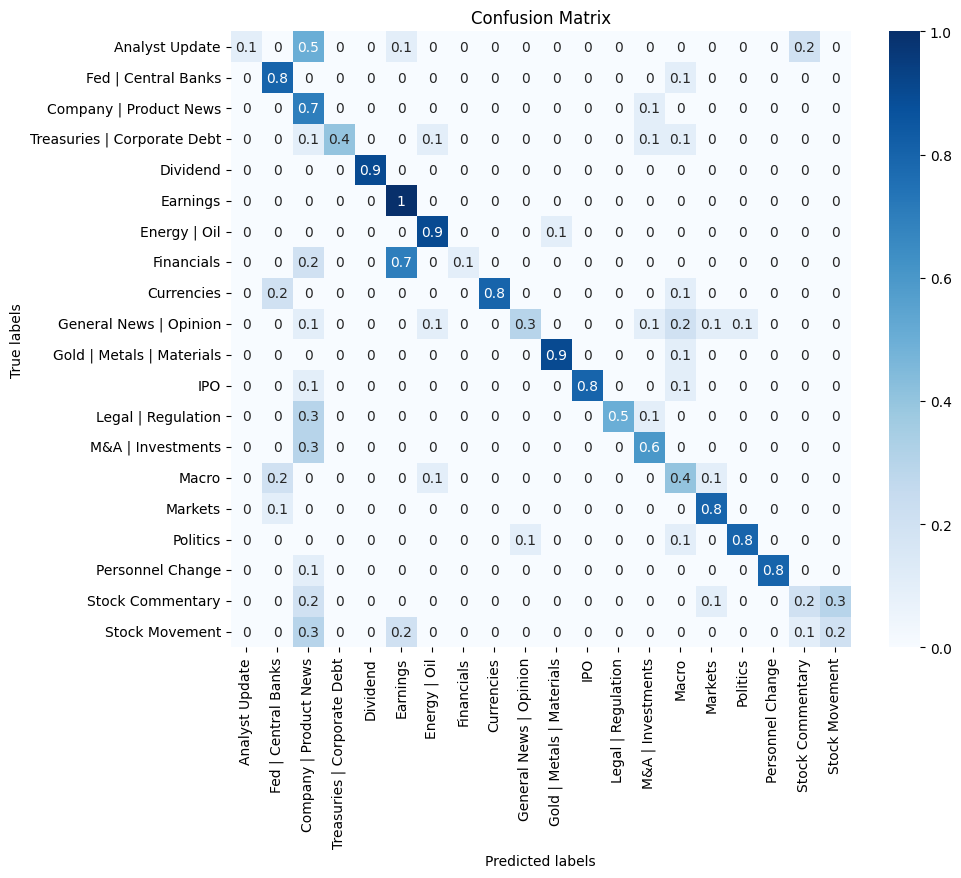

In [58]:
analyze(test_df.dropna(), 'few_shot_gpt')

### 2.5 Optimal Technique Application <a id="part-2-5"></a>

Applying the most effective technique(s) based on previous experiments to enhance model performance.

Despite our efforts to combine the techniques, we encountered significant challenges that hindered our ability to achieve the desired task completion. The classical machine learning techniques we initially applied did not demonstrate significant performance improvements compared to the zero-shot and few-shot GPT implementations. Given the complexity of the dataset, achieving satisfactory results with these methods proved to be quite challenging.

Additionally, the computational resources required for GPT classifications were substantial, and conducting another round of classification was not feasible within our constraints. This limitation prevented us from exploring further combinations of techniques effectively.

However, we did brainstorm some potential improvements for future endeavors:

- Ensemble Learning: One approach could involve bagging different classifiers and classifying based on majority vote. By analyzing confusion matrices, we observed variance between the classifiers that could potentially be leveraged through ensemble methods like bagging.

- Meta-Model Creation: Another avenue for improvement is to create a meta-model that combines the outputs of various models or techniques. This meta-model might capture more nuanced patterns in the data that individual models might overlook.

While we were unable to fully explore these avenues in this iteration, we believe that incorporating these strategies could lead to enhanced performance in future iterations.



---

# Part 3: State of the Art Comparison <a id="part-3"></a>

### 3.1 Full Dataset Training <a id="part-3-1"></a>

Incremental training with various percentages of the full dataset.

Here we just use our BertFinetuner and select_representative_dataset Classes, to generate diffrent size datasets and train our bert model on it. We suspect that performance will improve in a logarithmic manner with percentage of the dataset used. At first (when the number of samples is very small), the model will fail to produce particularly effective clasification (although likely much better than random chance). As we start to add more, the improvements will be large as the model has a much richer set of information from which it can build representations. As we keep adding data, though, the model will experience diminishing returns as the amount of useful information the model can encode reaches a threshold. 

### Training

In [76]:
dataset_percentage = [1.0, 0.75, 0.5, 0.25, 0.1, 0.01]

In [40]:
import tensorflow as tf
from tensorflow.keras import backend as K

dataset_percentage = [1.0, 0.75, 0.5, 0.25, 0.1, 0.01]

for percentage in dataset_percentage:
    K.clear_session()
    train_data, _ = select_representative_dataset(train_df, frac=percentage)
    print(len(train_data))

    tuner = BertFinetuner(train_data, freeze_weights=False, epochs=5, drop_out=0.6, batch_size=16, lr=1e-04, weight_classes=True).train()
    name = f'bert_{int(percentage * 100)}pct'
    train_df[name] = tuner.predict(train_df)
    test_df[name] = tuner.predict(test_df)
    val_df[name] = tuner.predict(val_df)

    K.clear_session()

11812


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_transform.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_layer_norm.weight']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


Epoch 1/5
738/738 [==============================] - 79s 72ms/step - loss: 1.3322 - recall: 0.4540 - precision: 0.7764
Epoch 2/5
738/738 [==============================] - 44s 59ms/step - loss: 0.5871 - recall: 0.7332 - precision: 0.8525
Epoch 3/5
738/738 [==============================] - 43s 58ms/step - loss: 0.3309 - recall: 0.8482 - precision: 0.8977
Epoch 4/5
738/738 [==============================] - 43s 58ms/step - loss: 0.1931 - recall: 0.9027 - precision: 0.9293
Epoch 5/5
129/129 [==============================] - 4s 31ms/step
8859


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_transform.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_layer_norm.weight']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


Epoch 1/5
553/553 [==============================] - 61s 75ms/step - loss: 1.4422 - recall: 0.4221 - precision: 0.7621
Epoch 2/5
553/553 [==============================] - 34s 61ms/step - loss: 0.5597 - recall: 0.7543 - precision: 0.8567
Epoch 3/5
553/553 [==============================] - 32s 58ms/step - loss: 0.3441 - recall: 0.8372 - precision: 0.8948
Epoch 4/5
553/553 [==============================] - 32s 58ms/step - loss: 0.2385 - recall: 0.8962 - precision: 0.9280
Epoch 5/5
129/129 [==============================] - 4s 31ms/step
5906


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_transform.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_layer_norm.weight']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


Epoch 1/5
369/369 [==============================] - 51s 82ms/step - loss: 1.8453 - recall: 0.2907 - precision: 0.7536
Epoch 2/5
369/369 [==============================] - 23s 63ms/step - loss: 0.7387 - recall: 0.6594 - precision: 0.8239
Epoch 3/5
369/369 [==============================] - 22s 61ms/step - loss: 0.4904 - recall: 0.7793 - precision: 0.8695
Epoch 4/5
369/369 [==============================] - 22s 60ms/step - loss: 0.2194 - recall: 0.8925 - precision: 0.9234
Epoch 5/5
129/129 [==============================] - 4s 34ms/step
2953


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_transform.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_layer_norm.weight']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


Epoch 1/5
184/184 [==============================] - 39s 97ms/step - loss: 2.1208 - recall: 0.1943 - precision: 0.6976
Epoch 2/5
184/184 [==============================] - 13s 68ms/step - loss: 0.8296 - recall: 0.6020 - precision: 0.8099
Epoch 3/5
184/184 [==============================] - 12s 63ms/step - loss: 0.4380 - recall: 0.7862 - precision: 0.8750
Epoch 4/5
184/184 [==============================] - 11s 62ms/step - loss: 0.2186 - recall: 0.8791 - precision: 0.9169
Epoch 5/5
129/129 [==============================] - 4s 31ms/step
1181


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_transform.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_layer_norm.weight']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


Epoch 1/5
73/73 [==============================] - 30s 131ms/step - loss: 3.0574 - recall: 0.0034 - precision: 0.2667
Epoch 2/5
73/73 [==============================] - 9s 127ms/step - loss: 2.1210 - recall: 0.1305 - precision: 0.6756
Epoch 3/5
73/73 [==============================] - 9s 126ms/step - loss: 1.1323 - recall: 0.4987 - precision: 0.7959
Epoch 4/5
73/73 [==============================] - 5s 69ms/step - loss: 0.4963 - recall: 0.7391 - precision: 0.8584
Epoch 5/5
129/129 [==============================] - 4s 32ms/step
118


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_transform.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_layer_norm.weight']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


Epoch 1/5
7/7 [==============================] - 23s 147ms/step - loss: 3.4775 - recall: 0.0000e+00 - precision: 0.0000e+00
Epoch 2/5
7/7 [==============================] - 1s 129ms/step - loss: 3.0280 - recall: 0.0000e+00 - precision: 0.0000e+00
Epoch 3/5
7/7 [==============================] - 1s 128ms/step - loss: 2.6805 - recall: 0.0000e+00 - precision: 0.0000e+00
Epoch 4/5
7/7 [==============================] - 1s 126ms/step - loss: 2.2979 - recall: 0.0098 - precision: 1.0000
Epoch 5/5
129/129 [==============================] - 4s 31ms/step


### Plotting Fuctions

In [77]:
bert_models = [f'bert_{int(pct*100)}pct' for pct in dataset_percentage[::-1]]
my_models = ['random', 'TF-IDF', 'bert32_tuned', 'bert32_cos_similar', 'gpt3.5_bert', 'zero_shot_gpt']  + bert_models
all_models = my_models + ['SOTA']

In [74]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

def calculate_metrics(df: pd.DataFrame, checkpoint: str, threshold=0.5):
    predicted_labels = df[checkpoint]
    true_labels = df['label']

    accuracy = accuracy_score(true_labels, predicted_labels)
    recall = recall_score(true_labels, predicted_labels, average='macro')
    precision = precision_score(true_labels, predicted_labels, average='macro')
    f1 = f1_score(true_labels, predicted_labels, average='macro')

    return accuracy, recall, precision, f1


def get_metrics_df(df: pd.DataFrame, models: list):

    metrics = {}
    for model in models:

        row = (accuracy, recall, precision, f1) = calculate_metrics(df, model)

        metrics[model] = row

    metrics['SOTA'] = (0.910615, 0.910615, 0.911335, 0.910647)

    return pd.DataFrame.from_dict(metrics, columns=['accuracy', 'recall', 'precision', 'f1'], orient='index').sort_values('accuracy')



def plot_metrics(metrics_df: pd.DataFrame, cmap='summer'):
    from matplotlib import pyplot as plt

    # Plot the DataFrame as a bar chart
    ax = metrics_df.T.plot(kind='bar', figsize=(14, 6), rot=0, width=0.8, cmap=cmap, edgecolor='black', position=0.5)

    # Adding labels and title
    ax.set_ylabel('Score')
    ax.set_xlabel('Metrics')
    ax.set_title(f'Performance Metrics for Different Training Set Pct')

    # Adding gridlines
    ax.grid(True, axis='y', linestyle='--', color='gray', alpha=0.5)

    # Adding legend outside of the plot
    ax.legend(bbox_to_anchor=(1.0, 1), loc='upper left')

    # Adding scores inside each bar
    for i in ax.patches:
        ax.text(i.get_x() + i.get_width() / 2, i.get_height() + 0.001, str(round(i.get_height(), 2)), ha='center', color='black')

    # Save plot in 'plots' directory
    # plt.tight_layout()
    plt.show() #savefig(f'plots/{dataset_name}_metrics_plot.png', dpi=300)

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import warnings

def analyze(df, pred_col):

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")



        # Plot confusion matrix
        cm = confusion_matrix(df['label'], df[pred_col], normalize='true').round(1)
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=label2topic.values(), yticklabels=label2topic.values())
        plt.xlabel('Predicted labels')
        plt.ylabel('True labels')
        plt.title('Confusion Matrix')

        return plt


def plot_cf_matrices(dataframe, model_names):
    fig, axs = plt.subplots(2, 2, figsize=(14, 12))

    # Flatten the axs array to iterate over its elements individually
    axs = axs.flatten()

    for model, ax in zip(model_names, axs):
        cm = confusion_matrix(dataframe['label'], dataframe[model], normalize='true').round(1)
        sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', ax=ax)
        ax.set_xlabel('Predicted labels')
        ax.set_ylabel('True labels')
        ax.set_title(model)

    plt.tight_layout()  # Adjust layout to prevent overlapping
    plt.show()

In [52]:
train_metrics = get_metrics_df(train_df, bert_models)

test_metrics = get_metrics_df(test_df.fillna(18), my_models)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### 3.2 Learning Curve <a id="part-3-2"></a>

Plotting a learning curve based on the training data percentages.

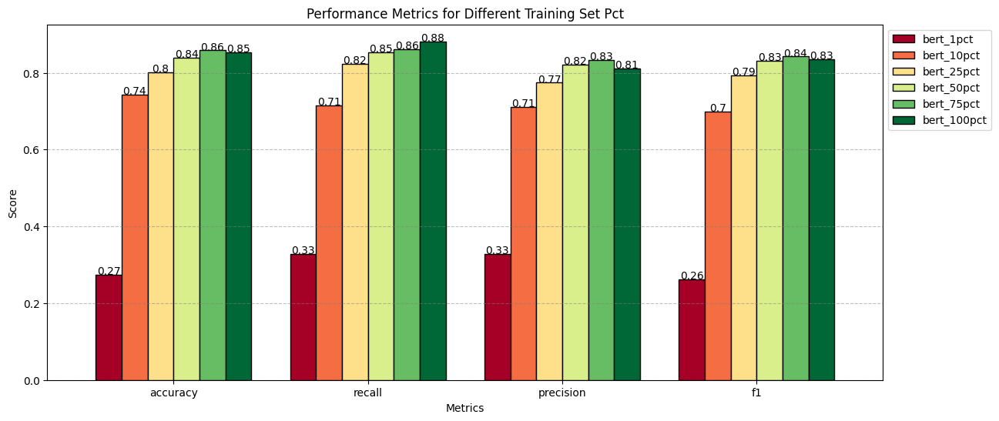

In [49]:
plot_metrics(test_metrics.loc[bert_models], cmap='RdYlGn')

As predicted, the metrics all improve in a logarithmic-type manner. However, when trained on the entire dataset, the performance was slightly worse (apart from recall) than when it was trained on 75% of the data. This is either because the model has hit its maximum feature extraction threshold and the difference is just noise, or because we have started to overfit. We know from the SOTA model's performance (with accuracy recall and precission all in the high 90s) that our models are not perfectly tuned. Additionally, though, our dataset probably represented a more difficult classification set than most testing sets because of its specific focus on finance and its limited character count. Nonetheless, our model shows good increases in the lower percentages relative to SOTA and our benchmark. 


Overall BERT seems to really like bigger datasets, scaling well with them. However, at some point just increasing the dataset size is no longer sufficient and more hyperparameter tuning is needed.


### 3.3 Technique Comparison <a id="part-3-3"></a>

Here we compare all training techniques explored so far.

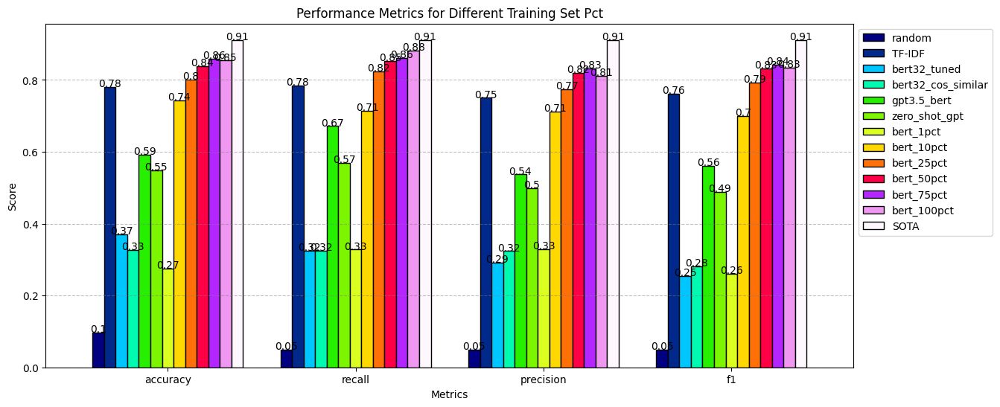

In [54]:
plot_metrics(test_metrics.loc[all_models], cmap='gist_ncar') #

Comparing the performance of our previous models paints an interesting picture. First, we note that the Zero Shot GPT model's (light green) performance is only marginally worse than the 10% bert model (yellow), which was trained on about 1100 samples. Given it was trained on no samples, this is really impressive. The GPT augmented limited sample BERT model (dark green) also performed well using a very small number of samples. These samples were sufficient to improve all metrics by a few percentage points over the zero shot learning model, implying that GPT is effective both at instantiating zero shot learning, but also with aiding training in other models - an extremely powerful tool. It is also important to note that our BERT model that used cosine similarity on the 32 samples (turqoise) outperformed the 1% model (lime) that was trained on over 100 samples, which is testament to the success of the data augmentation and hyperparameter optimisation procedures. It is also good to see that BERT 25% (orange) was better than simple TF-IDF, which means the far more sophisticated architecture evident in BERT's design actually does improve performance over conventional statistical methods. Of course, SOTA (white) is still significantly better than our best model, but this result comes with some caveats. First, SOTA was trained on a dataset 115% the size of ours, and underwent hyperparameter optimisation, which we did not have the resources to do effectively. Second, SOTA was trained on a better dataset for multilabel classification: there was no specific focus in the dataset. Samples were taken from several generic sources on the internet. Our model was trained on a specialised and largely similar dataset about finance. Their dataset also had no limit on the number of characters, whereas our dataset was limited by Twitter to 280 characters. 


### 3.4 Methodology Analysis <a id="part-3-4"></a>

Analyze and compare all methods employed. Discuss the effectiveness and limitations observed.

First lets look at 4 diffrent models:
['bert32_tuned', 'zero_shot_gpt', 'gpt3.5_bert', 'best_bert']

we plot the confusion matricies of all to identify potential similarities and differences in the models

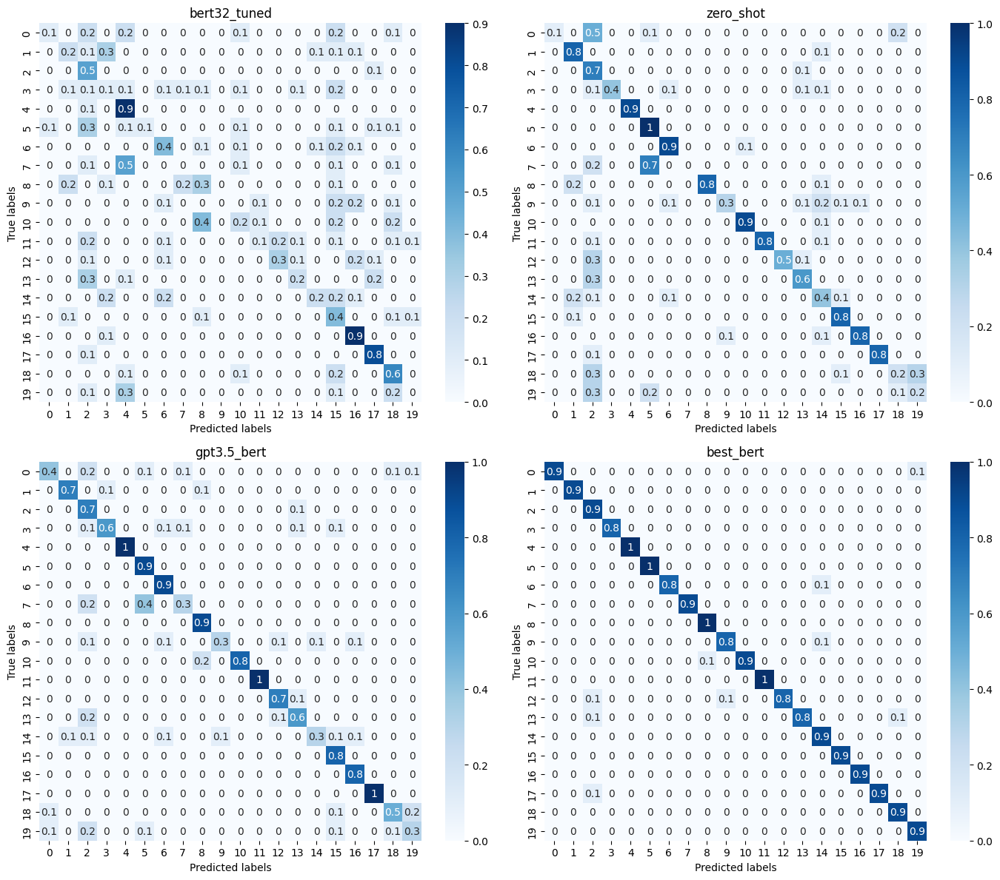

In [147]:
model_names = ['bert32_tuned', 'zero_shot_gpt', 'gpt3.5_bert', 'best_bert']


# Call the function
plot_cf_matrices(test_df.fillna(2), model_names)

It is immediately clear from these plots that GPT was an exceptional addition to our arsenal. BERT-32 (top left), despite undergoing some hyperparameter tuning, was unable to classify consistently the tweets, apart from some success in the more distinct and common classes. Once GPT (bottom left) was added to its design, though, its performance was far stronger, achieving near perfect precision for some classes. Additionally, on its own in a zero-shot capacity (top right), it was able to classify correctly the text much of the time (though it varies substantially throughout the classes). This result implies that its understanding of natural language is incredibly sophisticated, as this task was extremely difficult, featuring very similar classes and not much corresponding text. The best BERT model (bottom right) was the best performer, but was trained on the full dataset, so this result is not suprising, although still extremely impressive given the nature of the task. 

### Ploting Missclassification Distributions

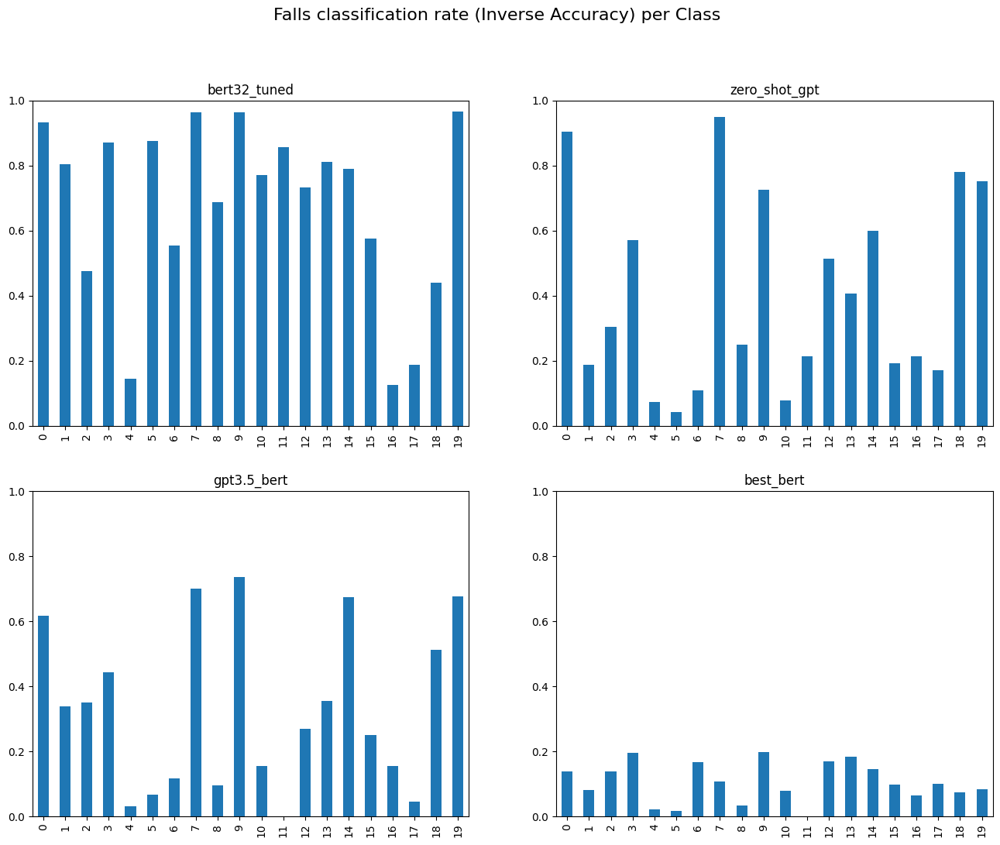

In [78]:
def plot_falls_calssification(df, model, ax):

    fc = df[df['label'] != df[model]].copy()

    (fc['label'].value_counts().sort_index() / df['label'].value_counts().sort_index()).plot(kind='bar', ax=ax, title=model, ylim=(0, 1))




from wordcloud import WordCloud

def plot_falls_wordclouds(df, model, axis):

    fc = df[df['label'] != df[model]].copy()

    all_words = ' '.join(fc['text_preprocessed'])

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words)

    # Display the word cloud in the specified axis
    axis.imshow(wordcloud, interpolation='bilinear')
    axis.axis('off')
    axis.set_title(model)


model_names = ['bert32_tuned', 'zero_shot_gpt', 'gpt3.5_bert', 'best_bert']

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Falls classification rate (Inverse Accuracy) per Class', fontsize=16)


for model, ax in zip(model_names, axes.flatten()):
    plot_falls_calssification(test_df, model, ax)


This plot demonstrates that the sources of errors are systematic (i.e., consistent across models), and therefore likely stem from properties of some of the classes that make it difficult for the model to classify, rather than random outliers. Because a human put together this dataset, and the demarcation between different classes must have been somewhat arbitrary (which tweets belong in IPOs vs. energy? What if an energy company is merging with an oil company?), there may have been some human-level inconsistencies in the classifications which made it difficult for the model to disambiguate highly overlapping classes.

### Examples Of missclassified Tweets

In [71]:
def wrong_classified(df, model):

    false = df[(df['label'] != df[model])]

    wrong = []
    for label in label2topic.keys():
        false_class = false[false['label'] == label]

        try:
            wrong_label = false_class[model].iloc[0]
            text = false_class['text'].iloc[0]
        except:
            continue

        row = {'real': label2topic[label], 'model': label2topic[wrong_label], 'text': text}

        wrong.append(row)

    return pd.DataFrame(wrong).style.set_properties(**{'text-align': 'left'})


pd.set_option('display.max_colwidth', 40)

### bert32_tuned Missclassified Tweets

In [72]:
wrong_classified(test_df, 'bert32_tuned')

,real,model,text
0,Analyst Update,Markets,"Loop upgrades CSX to buy, says it's a good place to park money ahead of potential recession https://t.co/5x22Aolnz2"
1,Fed | Central Banks,Markets,Watch Christine Lagarde speak after the ECB surprises markets with larger rate hike https://t.co/oquoiuuXsq
2,Company | Product News,Legal | Regulation,"Twitter maintains its argument that: “A lot of what Musk is asking for doesn't exist,"" @EdLudlow reports. Get the latest on Twitter v. Musk -- and the trial taking place in October https://t.co/o5XRjG0G1j https://t.co/ku380wppIi"
3,Treasuries | Corporate Debt,Fed | Central Banks,"Treasury yields have risen sharply recently. Increasing yields result in realized losses for fixed-income investors. In today’s post, the authors put these losses in a historical perspective and explore the possible factors contributing to the yield rise. https://t.co/VwiK2Z25Vg"
4,Dividend,Personnel Change,"Pacific Premier Bancorp, Inc. Announces Second Quarter 2022 Financial Results and a Quarterly Cash Dividend of $0.33 Per Share https://t.co/XdYwsc1tgy"
5,Earnings,Stock Movement,"Netflix's earnings results mark pivot point for streaming giant, for better or worse https://t.co/inq2hegQ0e"
6,Energy | Oil,Politics,"“I’m doing all I can to increase the supply."" President Joe Biden said he expects further oil supply increases after meeting with Saudi rulers https://t.co/RMwgsQdG9V https://t.co/ZDhjc0sGCl"
7,Financials,Fed | Central Banks,"Bank of America posted an increase in net interest income with the lender reaping the benefits of Federal Reserve rate hikes. Second-quarter results were hurt by higher expenses related to regulatory settlements, and net interest income rose 22% https://t.co/E0WH1CWIz7 https://t.co/OMh0OAodKe"
8,Currencies,Analyst Update,"Euro Nears Dollar Parity Join @tomkeene, @FerroTV & @lisaabramowicz1 for the conversations that power your day on Bloomberg TV, Bloomberg Radio & the Surveillance podcast: https://t.co/9DZT2QQ3Y7 https://t.co/UHWHJew4e1"
9,General News | Opinion,Stock Commentary,What really happens to Amazon returns https://t.co/nZS5oYqXQu


### zero_shot_gpt Missclassified Tweets

In [73]:
wrong_classified(test_df, 'zero_shot_gpt')

,real,model,text
0,Analyst Update,Stock Commentary,Analyst call of the day for @CNBCPro subscribers: Goldman Sachs reiterates Exxon as buy and says it’s bullish heading into earnings next week. Subscribe to see the analyst calls of the day curated by CNBC Pro. https://t.co/q2fXwZqMZ4
1,Fed | Central Banks,Macro,IMF set to make fresh downgrades to global growth https://t.co/jqrDEm1nrT
2,Company | Product News,Legal | Regulation,Citibank UK Regulatory Announcement: FRN Variable Rate Fix https://t.co/dBFOiJjoun https://t.co/KsWbbnwmuD
3,Treasuries | Corporate Debt,Fed | Central Banks,"Treasuries tumbled, with the two-year rate -- which is more sensitive to imminent changes in Fed policy -- climbing as much as 16 basis points to about 3.21%. The dollar hovered near its highest level since March 2020 https://t.co/SdbumamHOf https://t.co/DMHf6Tjx9j"
4,Dividend,Earnings,"Pacific Premier Bancorp, Inc. Announces Second Quarter 2022 Financial Results and a Quarterly Cash Dividend of $0.33 Per Share https://t.co/XdYwsc1tgy"
5,Earnings,Company | Product News,Supermicro Provides Fourth Quarter Fiscal Year 2022 Business Update https://t.co/vvfIHKLMoy https://t.co/19kSkzF2sn
6,Energy | Oil,Gold | Metals | Materials,$COMDX: Energy Settlement Prices https://t.co/PXzz87qzJZ
7,Financials,Fed | Central Banks,"Bank of America posted an increase in net interest income with the lender reaping the benefits of Federal Reserve rate hikes. Second-quarter results were hurt by higher expenses related to regulatory settlements, and net interest income rose 22% https://t.co/E0WH1CWIz7 https://t.co/OMh0OAodKe"
8,Currencies,Fed | Central Banks,The euro rallies as traders raised bets on the scale of future policy tightening by the European Central Bank after it raised borrowing costs by more than expected https://t.co/vxjpQvwspJ
9,General News | Opinion,Company | Product News,What really happens to Amazon returns https://t.co/nZS5oYqXQu


### gpt3.5_bert Missclassified Tweets

In [74]:
wrong_classified(test_df, 'gpt3.5_bert')

,real,model,text
0,Analyst Update,Stock Commentary,"Loop upgrades CSX to buy, says it's a good place to park money ahead of potential recession https://t.co/5x22Aolnz2"
1,Fed | Central Banks,Financials,PBOC Governor Yi Gang says the bank will step up with stronger support for China’s struggling economy. John Liu reports on Bloomberg Television https://t.co/1BVTQ7HTVm https://t.co/nLf8YBrX2C
2,Company | Product News,Treasuries | Corporate Debt,Citibank UK Regulatory Announcement: FRN Variable Rate Fix https://t.co/dBFOiJjoun https://t.co/KsWbbnwmuD
3,Treasuries | Corporate Debt,Currencies,"Treasuries tumbled, with the two-year rate -- which is more sensitive to imminent changes in Fed policy -- climbing as much as 16 basis points to about 3.21%. The dollar hovered near its highest level since March 2020 https://t.co/SdbumamHOf https://t.co/DMHf6Tjx9j"
4,Dividend,Treasuries | Corporate Debt,$BSMR - Invesco BulletShares 2027 Municipal Bond ETF declares monthly distribution of $0.0292 https://t.co/3aBrypFSVW
5,Earnings,Financials,United Security Bancshares Reports 2nd Quarter 2022 Financial Results https://t.co/KEEk2IVq4t https://t.co/lfL0Md7kA3
6,Energy | Oil,Macro,"@ManijehM national average fell 3.5c/gal to $4.567 per gallon, a 47 cent drop in the last 31 days, one of the largest monthly declines on record. So, pretty much already seen massive declines"
7,Financials,Energy | Oil,Halliburton beats on earnings and makes case for 'multiyear upcycle' in oil https://t.co/HNEFMwlnwW
8,Currencies,Gold | Metals | Materials,$USD/JPY Above 139 For First Time Since 1998
9,General News | Opinion,Company | Product News,What really happens to Amazon returns https://t.co/nZS5oYqXQu


### Best Missclassified Tweets

In [75]:
wrong_classified(test_df, 'best_bert')

,real,model,text
0,Analyst Update,Macro,BofA believes we're already in a recession — and says these stocks have what it takes to beat it https://t.co/gPAiu33mb9
1,Fed | Central Banks,Macro,$ICE: ICE Benchmark Administration Introduces Calendar Year Inflation Expectations to ICE U.S. Dollar Inflation... https://t.co/8TWnRo7YFw
2,Company | Product News,Analyst Update,"GM reveals electric Chevrolet Blazer priced starting at $45,000 https://t.co/OyZmNaBUcW"
3,Treasuries | Corporate Debt,Currencies,"Treasuries tumbled, with the two-year rate -- which is more sensitive to imminent changes in Fed policy -- climbing as much as 16 basis points to about 3.21%. The dollar hovered near its highest level since March 2020 https://t.co/SdbumamHOf https://t.co/DMHf6Tjx9j"
4,Dividend,Earnings,"Pacific Premier Bancorp, Inc. Announces Second Quarter 2022 Financial Results and a Quarterly Cash Dividend of $0.33 Per Share https://t.co/XdYwsc1tgy"
5,Earnings,Macro,"These companies are likely to beat earnings expectations this season, Bank of America says https://t.co/xUe6D6sbhN"
6,Energy | Oil,Markets,#Energy futures pull back some $XLE $CL_F $TNX $SPY $QQQ $DIA $SPX $COMPQ $DJIA https://t.co/LzEmmlQJhI #economy #stockmarket
7,Financials,Stock Movement,Halliburton beats on earnings and makes case for 'multiyear upcycle' in oil https://t.co/HNEFMwlnwW
8,Currencies,Stock Commentary,$USDC-USD - USD Coin Stablecoin Interest Update: CeFi Implosion. https://t.co/oAxOKbBoEO #markets #trading #stocks
9,General News | Opinion,Company | Product News,What really happens to Amazon returns https://t.co/nZS5oYqXQu


### Comments:

First, it is important to note that this is a case in which the human-designated labels are by no means absolute. We might have a lengthy debate about the correct classification of these tweets, which stems from the classes featuring significant overlap in their definitions.

 Nonetheless, there are some consistent similarities between the mistakes made by the three models. The Bert-32 model's misclassifications stem from misinterpretation of the context more than the other models. For example, in one tweet, Joe Biden talks about the oil supply in Saudi Arabia. With limited training data pertaining to financial tweets, presumably BERT, which is pretrained on a more general dataset, assumed Joe Biden was indicative of politics which, in more general publications, would be a fair assumption. Similarly, another tweet reports that Republicans held a private retreat for donors which the model (somewhat humourously) classified as 'personel change', presumably because it features the word 'retreat' followed by a group of people. These are mistakes that stem from the model having not been trained on specific financial information. 

 Similarly, zero-shot GPT was fooled by misleading wording: one tweet refers to CitiBank's regulatory requirement and is a very short tweet. The word regulatory likely implied to the model that the piece was about legal regulation but, because it was issued by a private institution, it was actually classified under company and product news. This distinction would require a more sophisticated understanding of the financial world which, given zero samples from this dataset were supplied as training material, the model does not have. Another tweet simply reads 'what really happens to Amazon returns'. The model classified it as company and product news, but it was really a general news opinion. The intonation of the title makes it clear that it is an opinion piece - a company announcement would be much more formal. The model is unable to pick up on this subtlety because it has not been exposed to a great deal of similar corporate text. 

 The best BERT model's mistakes are more sophisticated and, frankly, I'm not sure they are due to poor performance by the model rather than ambiguity in the dataset's classification. For instance, the tweet: '#Energy futures pull back some CL_F SPY DIA =COMPQ $DJIA https://t.co/LzEmmlQJhI #economy #stockmarket' pertains both to the stock market, but specifically the energy market. Often the tweet fits well into many categories. In computer vision classification tasks, researchers often allow multi-label classification so the model is not penalised for good understanding (i.e., an image of a person is also an image of a man). Perhaps a more refined version of our model would incorporate this feature. 
 
  







---

## Part 4: Model Distillation <a id="part-4"></a>

In [30]:
from time import time


###Procedure:    
    
- **Replicate SOTA BERT Model:** Start by replicating the state-of-the-art BERT model and fine-tuning its performance.

- **Dataset Generation:** Generate a large dataset comprising a mix of random tweets and regular text to form a diverse dataset.

- **Soft Classification:** Utilize the best-performing BERT model to perform soft classification on the dataset, treating its outputs as targets.

- **Distillation Process:** Develop a smaller Transformer architecture in Keras for distillation purposes.

- **Training:** Train the smaller "distilled" model using the newly generated dataset to improve its performance.


    


### 4.1 Model Distillation <a id="part-4-1"></a>

Distilling the best-performing model into a lighter model. Document the process and tools used.

In [31]:
from train_bert import BertFinetuner

In [32]:
name = 'best_bert'

### Training the Teacher

In [31]:
# building teacher to reach close to sota performance

tuner = BertFinetuner(train_df, checkpoint='bert-base-cased', batch_size=16, max_length=100, weight_classes=True,
                      freeze_weights=False, epochs=10, lr=2e-05, drop_out=0.6, beta1=0.9, beta2=0.999, epsilon=1e-08).train()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

Epoch 1/10


740/740 [==============================] - 157s 150ms/step - loss: 1.8412 - recall: 0.2964 - precision: 0.7650
Epoch 2/10
740/740 [==============================] - 102s 137ms/step - loss: 0.6651 - recall: 0.6973 - precision: 0.8360
Epoch 3/10
740/740 [==============================] - 100s 134ms/step - loss: 0.3647 - recall: 0.8114 - precision: 0.8861
Epoch 4/10
740/740 [==============================] - 101s 136ms/step - loss: 0.2543 - recall: 0.8652 - precision: 0.9122
Epoch 5/10
740/740 [==============================] - 100s 135ms/step - loss: 0.1675 - recall: 0.9064 - precision: 0.9348
Epoch 6/10
740/740 [==============================] - 100s 136ms/step - loss: 0.1426 - recall: 0.9233 - precision: 0.9447
Epoch 7/10
740/740 [==============================] - 100s 135ms/step - loss: 0.0938 - recall: 0.9466 - precision: 0.9600
Epoch 8/10
740/740 [==============================] - 100s 135ms/step - loss: 0.0951 - recall: 0.9508 - precision: 0.9630
Epoch 9/10
740/740 [===============

In [32]:
t0 = time()
train_df[name] = tuner.predict(train_df)
test_df[name] = tuner.predict(test_df)
val_df[name] = tuner.predict(val_df)

print('Prediction Time:', time() - t0)

129/129 [==============================] - 11s 85ms/step


### Teacher Model Performance

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.78      0.79      0.79        73
        Fed | Central Banks       0.90      0.89      0.90       214
     Company | Product News       0.91      0.89      0.90       852
Treasuries | Corporate Debt       0.82      0.82      0.82        77
                   Dividend       0.98      0.99      0.98        97
                   Earnings       0.94      0.97      0.95       242
               Energy | Oil       0.79      0.84      0.81       146
                 Financials       0.94      0.93      0.93       160
                 Currencies       0.86      0.94      0.90        32
     General News | Opinion       0.85      0.80      0.82       336
  Gold | Metals | Materials       0.65      0.85      0.73        13
                        IPO       0.88      1.00      0.93        14
         Legal | Regulation       0.86      0.89      0.88       119
          

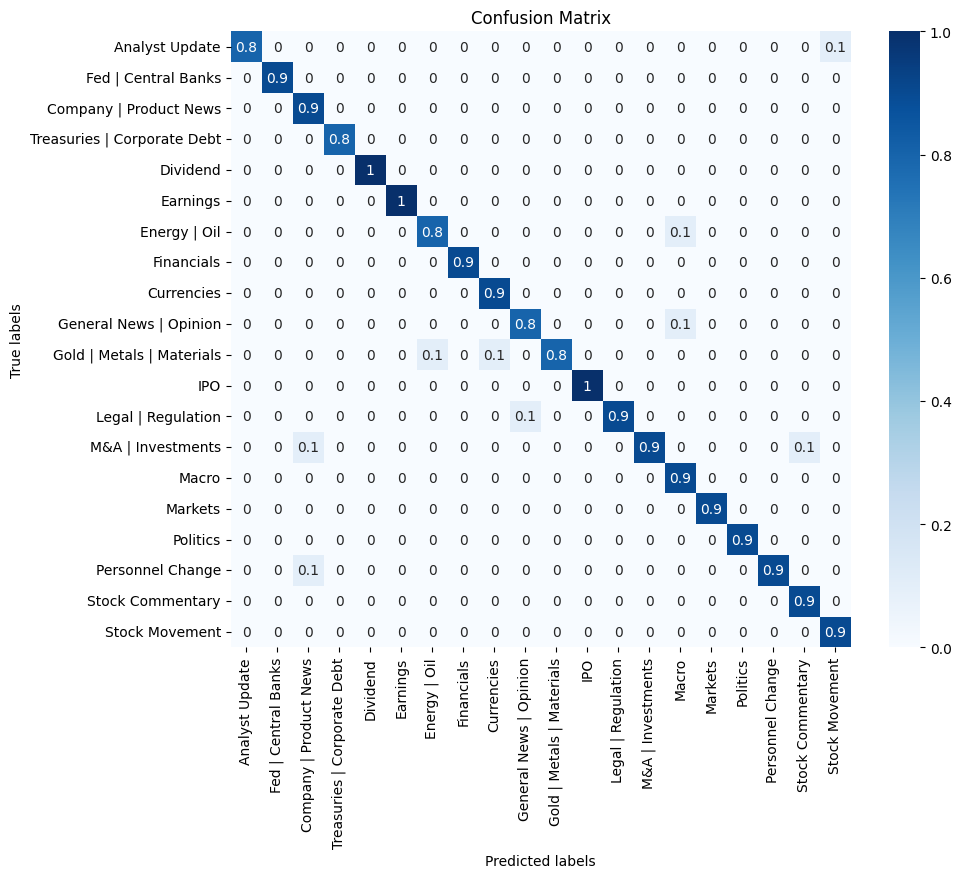

In [33]:
analyze(test_df, 'best_bert')

The model metrics show promising results. Next, we'll delve deeper into its performance by comparing false negatives and false positives with the student model. Before that, let's start constructing the student model and generating input text.

## Synthetic Data Creation

We employed various methods to generate additional training data for our student model:

- **Random Sentence Swaps:** Interchanging sentences in multi-sentence comments randomly.

- **Random Word Deletion:** Removing words randomly from sentences.

- **Random Word Swap:** Exchanging words randomly within sentences.

- **Fully Random Tweets:** Drawing completely random sequences from a word distribution, with lengths of 4, 7, and 16.

- **Random Combinations:** Mixing the above methods to create diverse synthetic data.

With this approach, we've created a "synthetic_dataset" for soft classification by our teacher model. Subsequently, we can utilize this dataset to train our student model.

In [34]:
from sythetic_data import generate_synthetic_dataset

In [35]:
sythetic_data = generate_synthetic_dataset(train_df)

In [36]:
sythetic_data

,text
0,"$ZENV issues, Leafly Mostly. ‘Aircarbon’"
1,"12.97M) Dumb Voya Schneider Visa,"
2,"$EC. estimates, shuffle FHC's $2.32M"
3,reaffirmed CEOs $0.0470 CUBIC transcript
4,Platform WSJ Orlando Qichao Indonesian
...,...
87095,lead stock-market surge as Russell 2000 sees b...
87096,Quarter Announces Stem Call 2022 https://t.co...
87097,BlackRock's greenest ETFs attract inflows as E...
87098,https://t.co/7hTJQNyr5F #stocks #investing #t...


In [37]:
# soft classification of the teacher
soft_probs = tuner.model.predict(tuner.turn_df_to_inputs(sythetic_data))

2722/2722 [==============================] - 229s 84ms/step


In [38]:
soft_probs.shape

(87100, 20)

In [33]:
sythetic_data = pd.read_pickle('saved_data/sythetic_df.pkl')
soft_probs = np.load('saved_data/sythetic_soft_probs.npy')

Here, we're comparing the average soft probabilities generated by the teacher model with the actual class distribution. The soft probability distributions closely resemble the real distribution, with the exception of label 18 (Stock commentary), which is slightly higher. This discrepancy occurs because short randomly generated comments often bear similarities to this class. We colloquially refer to this as the 'dustbin class'. 


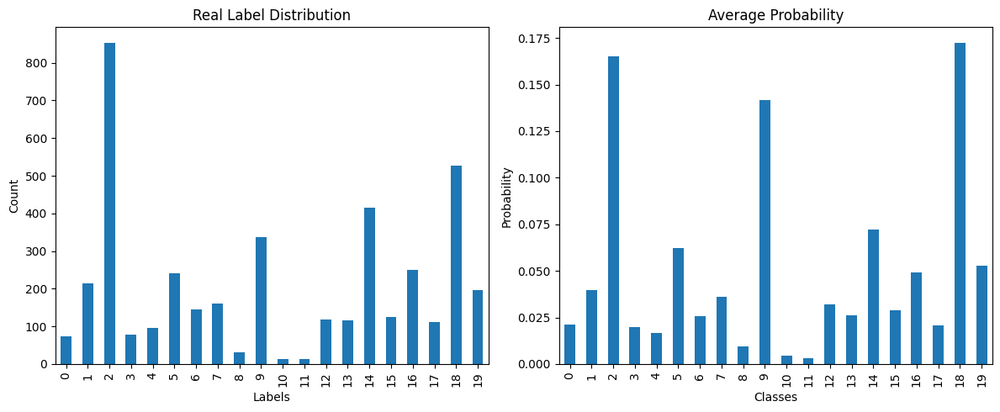

In [34]:
# Create a figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot for 'label' distribution
test_df['label'].value_counts().sort_index().plot(kind='bar', ax=axs[0])
axs[0].set_title('Real Label Distribution')
axs[0].set_xlabel('Labels')
axs[0].set_ylabel('Count')

# Plot for average probability
pd.Series(soft_probs.mean(axis=0)).plot(kind='bar', ax=axs[1])
axs[1].set_title('Average Probability')
axs[1].set_xlabel('Classes')
axs[1].set_ylabel('Probability')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

Below, we define our teacher model, which can be examined further in the distillation.py file. We create a MicroBert class, which is essentially a miniature Encoder Transformer with a classification block appended at the end.

Our chosen model has a hidden dimension/word embedding dimension of 256, with 8 multi-head attention heads and 4 encoder blocks.

We then utilize our synthetic dataset and the soft probabilities generated by our teacher model, combined with a KL-Divergence loss function. This function penalizes large differences in distributions, aiding in teaching our student model.

The exact implementation can be found in the distilation.py file

In [ ]:
from distilation import BertDistiller

In [ ]:
student = BertDistiller(text=sythetic_data['text'].to_list(),
                        soft_probs=soft_probs,
                        tokenizer='bert-base-cased',
                        lr=3e-05, epochs=10,
                        hidden_dim = 256, num_heads = 8, num_layers=4)

In [ ]:
student.train()

In [35]:
name = 'MicroBert'

In [ ]:


t0 = time()
train_df[name] = student.predict(train_df)
test_df[name] = student.predict(test_df)
val_df[name] = student.predict(val_df)

print('Prediction Time:', time() - t0)

Classification Report:
                             precision    recall  f1-score   support

             Analyst Update       0.00      0.00      0.00        73
        Fed | Central Banks       0.00      0.00      0.00       214
     Company | Product News       0.20      0.54      0.29       852
Treasuries | Corporate Debt       0.00      0.00      0.00        77
                   Dividend       0.00      0.00      0.00        97
                   Earnings       0.00      0.00      0.00       242
               Energy | Oil       0.00      0.00      0.00       146
                 Financials       0.00      0.00      0.00       160
                 Currencies       0.00      0.00      0.00        32
     General News | Opinion       0.09      0.04      0.05       336
  Gold | Metals | Materials       0.00      0.00      0.00        13
                        IPO       0.00      0.00      0.00        14
         Legal | Regulation       0.00      0.00      0.00       119
          

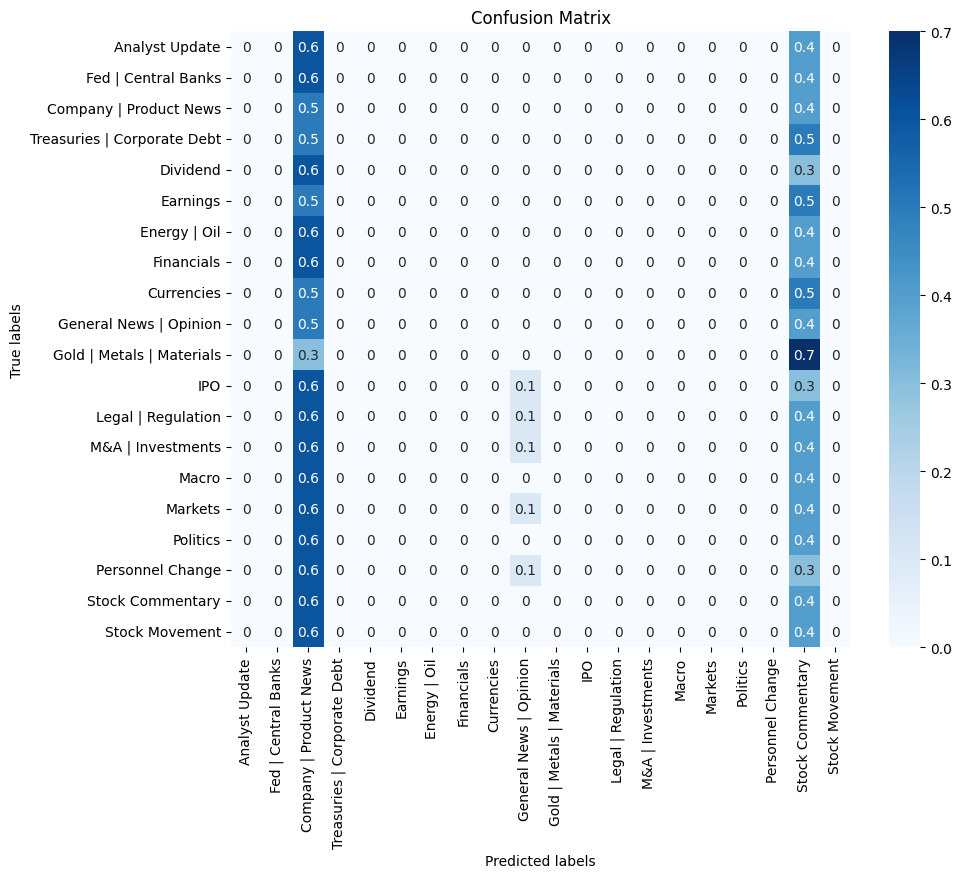

In [36]:
analyze(test_df, name)

### 4.2 Performance and Speed Comparison <a id="part-4-2"></a>

Evaluating the distilled model's performance and inference speed compared to the original.

As observed, the model distillation process didn't yield the expected results. It simply predicts the two most common probabilities from the synthetic training set, resulting in poor performance. Possible reasons for this could include experimenting with different loss functions instead of KL-Divergence, trying a different or larger model architecture, or investigating potential fundamental issues with the model architecture.

Additionally, the quality of the generated soft probabilities and synthetic data might be considered, although it's deemed less likely to be the primary cause of the poor performance.

### 4.3 Analysis and Improvements <a id="part-4-3"></a>

Analyzing deficiencies in the student model's learning. Suggest potential improvements or further research directions.

Although we couldn't analyze the performance deficit of our distilled model due to implementation issues, we can still draw some conclusions:

The prediction performance of the distilled model shouldn't be affected by weights. To add more value to this study, we decided to benchmark different encoder configurations and their prediction speed. Here's what we found:

### Benchmarking Transformer Encoder Prediction Times

In [38]:
from distilation import BertDistiller

In [39]:
results = {}

print('prediction time over {len(val_df)} samples')

t0 = time()
BertFinetuner(train_df.iloc[:20], checkpoint='bert-base-cased', batch_size=16, max_length=100, weight_classes=True,
                      freeze_weights=False, epochs=10, lr=2e-05, drop_out=0.6, beta1=0.9, beta2=0.999, epsilon=1e-08).predict(val_df)
print('bert-base-cased prediction time:', time()-t0)



for num_layers in [4, 8, 16]:
  for hidden_dim in [128, 256, 512, 1024]:
    for num_heads in [4, 8, 16, 32]:
      student = BertDistiller(text=sythetic_data['text'].iloc[:20].to_list(),
                              soft_probs=soft_probs[:20],
                              hidden_dim = hidden_dim, num_heads =num_heads,num_layers=num_layers)


      t0 = time()

      student.predict(val_df)

      total_t = time()-t0

      print(f'Layers: {num_layers} hidden_dim:{hidden_dim} num_heads:{num_heads} | prediction time:', total_t)

      results[(num_layers, hidden_dim, num_heads)] = total_t


prediction time over {len(val_df)} samples


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

129/129 [==============================] - 14s 83ms/step
bert-base-cased prediction time: 30.055636167526245
cuda 30522
torch.Size([20, 100])


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


torch.Size([4117, 100])
Layers: 4 hidden_dim:128 num_heads:4 | prediction time: 5.242615461349487
cuda 30522
torch.Size([20, 100])


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


torch.Size([4117, 100])
Layers: 4 hidden_dim:128 num_heads:8 | prediction time: 3.9126086235046387
cuda 30522
torch.Size([20, 100])
torch.Size([4117, 100])
Layers: 4 hidden_dim:128 num_heads:16 | prediction time: 3.27667498588562
cuda 30522
torch.Size([20, 100])
torch.Size([4117, 100])
Layers: 4 hidden_dim:128 num_heads:32 | prediction time: 3.9121057987213135
cuda 30522
torch.Size([20, 100])
torch.Size([4117, 100])
Layers: 4 hidden_dim:256 num_heads:4 | prediction time: 3.837651491165161
cuda 30522
torch.Size([20, 100])
torch.Size([4117, 100])
Layers: 4 hidden_dim:256 num_heads:8 | prediction time: 3.298935890197754
cuda 30522
torch.Size([20, 100])
torch.Size([4117, 100])
Layers: 4 hidden_dim:256 num_heads:16 | prediction time: 3.299109935760498
cuda 30522
torch.Size([20, 100])
torch.Size([4117, 100])
Layers: 4 hidden_dim:256 num_heads:32 | prediction time: 4.773146629333496
cuda 30522
torch.Size([20, 100])
torch.Size([4117, 100])
Layers: 4 hidden_dim:512 num_heads:4 | prediction time

In [40]:
results_df = pd.Series(results).reset_index()
results_df.columns = ['num_layers', 'hidden_dim', 'num_heads', 'Time']

### Analyzing Benchmark Times

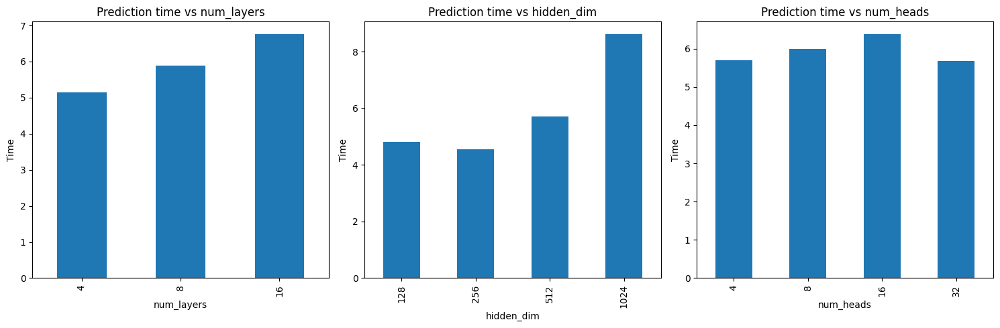

In [41]:
import matplotlib.pyplot as plt

# Create subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot for 'num_layers'
results_df.groupby('num_layers')['Time'].mean().plot(kind='bar', ax=axs[0])
axs[0].set_title('Prediction time vs num_layers')
axs[0].set_xlabel('num_layers')
axs[0].set_ylabel('Time')

# Plot for 'hidden_dim'
results_df.groupby('hidden_dim')['Time'].mean().plot(kind='bar', ax=axs[1])
axs[1].set_title('Prediction time vs hidden_dim')
axs[1].set_xlabel('hidden_dim')
axs[1].set_ylabel('Time')

# Plot for 'num_heads'
results_df.groupby('num_heads')['Time'].mean().plot(kind='bar', ax=axs[2])
axs[2].set_title('Prediction time vs num_heads')
axs[2].set_xlabel('num_heads')
axs[2].set_ylabel('Time')

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

Here, we've observed some interesting relationships between model architecture and prediction time:

- Increasing the number of heads only marginally increases prediction time. This is likely because multi-head attention calculations can be parallelized, and with a fast GPU, they're not typically the bottleneck for prediction speed.

- The increase in prediction time appears to be more linear when adding more layers. This aligns with theory as Transformer Encoder layers work sequentially, so adding more layers should increase prediction time linearly.

- The trend suggests that the effect of embedding_dim/hidden_dim size on prediction time is exponential. Reducing this parameter to a size of 256 could significantly speed up calculations.

However, these findings should be interpreted cautiously as we didn't manage to produce any viable model performance metrics. With such metrics, it would be easier to draw conclusions regarding the best model specifications for a fast and high-performing distilled model.

# Validation Results

Here we are validating our finding and ensure we didnt overfit on the Train set:

In [78]:
val_metrics = get_metrics_df(val_df.fillna(18), my_models)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


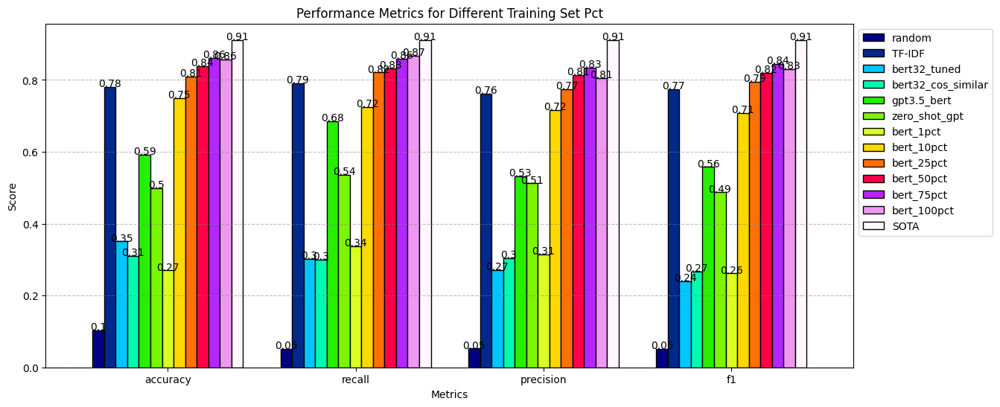

In [79]:
plot_metrics(val_metrics.loc[all_models], cmap='gist_ncar') #